# Internet of Things ELEC0130 20/21 Project
This notebook serves as the code implementation of the project assigned in the module Internet of Things ELEC0130 in the Department of Electronic and Electrical Engineering in UCL.

In [1]:
#!/usr/local/bin/python
# -*- coding:utf-8 -*-

import logging
import os
import time

import joblib
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from scipy import stats
from sklearn.decomposition import PCA
from sklearn.ensemble import RandomForestClassifier
from sklearn.feature_selection import SelectFromModel
from sklearn.metrics import (accuracy_score, auc, classification_report,
                             confusion_matrix, plot_confusion_matrix,
                             roc_auc_score, roc_curve)
from sklearn.model_selection import (GridSearchCV, learning_curve,
                                     train_test_split)
from sklearn.model_selection._split import ShuffleSplit
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler, normalize
from sklearn.svm import LinearSVC

In [2]:
# Directories and paths
home_dir = os.path.abspath(os.curdir)  # '/Users/friedrich/Projects/IOT_assignment/Codes'
data_path = os.path.join(home_dir, 'data', 'HH_Dataset.csv')
log_path = os.path.join(home_dir, 'helper', 'base_log.log')

In [3]:
# The configuration of logging module
logging.basicConfig(level=logging.INFO,
                    format='%(asctime)s %(filename)s[line:%(lineno)d] %(levelname)s %(message)s',
                    datefmt='%a, %d %b %Y %H:%M:%S',
                    filename=log_path,
                    filemode='w')

## Load data from the existing csv file

In [4]:
with open(data_path, 'r') as csvfile:
    df = pd.read_csv(data_path,
                     usecols=[
                         'Temperature', 'Relative Humidity', 'Pressure', 'Light Level', 'Noise Level', 'Occupancy'
                     ])

df['Occupancy'].replace({"Unoccupied": 0, "Occupied": 1}, inplace=True)

df.describe()

,Temperature,Occupancy,Light Level,Relative Humidity,Noise Level,Pressure
count,19983.000000,20000.000000,19896.000000,20000.000000,20000.000000,20000.000000
mean,19.010014,0.132750,0.570074,39.552730,38.079250,1020.955835
std,2.931338,0.339313,9.340129,8.744197,9.189069,12.995731
min,-1.900000,0.000000,0.000000,0.000000,0.000000,967.613940
25%,17.000000,0.000000,0.000000,33.400000,35.000000,1012.522421
50%,19.400000,0.000000,0.010000,39.000000,35.000000,1021.642536
75%,21.100000,0.000000,0.172500,45.300000,35.000000,1028.895972
max,38.200000,1.000000,760.150000,67.800000,256.000000,1065.056491


## Interpolate the missing data

In [5]:
# Check if there is any missing data for each column
df.info(verbose=True, show_counts=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20000 entries, 0 to 19999
Data columns (total 6 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   Temperature        19983 non-null  float64
 1   Occupancy          20000 non-null  int64  
 2   Light Level        19896 non-null  float64
 3   Relative Humidity  20000 non-null  float64
 4   Noise Level        20000 non-null  int64  
 5   Pressure           20000 non-null  float64
dtypes: float64(4), int64(2)
memory usage: 937.6 KB


In [6]:
interpolated_df = df.interpolate()  # method='linear' by default

print(f'{(interpolated_df.count() - df.count())} samples have been interpolated.')

Temperature           17
Occupancy              0
Light Level          104
Relative Humidity      0
Noise Level            0
Pressure               0
dtype: int64 samples have been interpolated.


In [7]:
df = interpolated_df

df.info(verbose=True, show_counts=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20000 entries, 0 to 19999
Data columns (total 6 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   Temperature        20000 non-null  float64
 1   Occupancy          20000 non-null  int64  
 2   Light Level        20000 non-null  float64
 3   Relative Humidity  20000 non-null  float64
 4   Noise Level        20000 non-null  int64  
 5   Pressure           20000 non-null  float64
dtypes: float64(4), int64(2)
memory usage: 937.6 KB


## Explore the data

Text(0.5, 1.0, 'Occupancy')

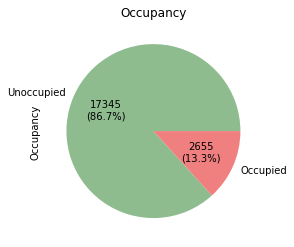

In [8]:
# Visualize the distribution of the label 'Occupancy'
def show_autopct(pct, data):
  absolute = int(pct/100.*np.sum(data))
  return  "{:d}\n({:.1f}%)".format(absolute, pct)

df['Occupancy'].value_counts().plot(
    kind='pie',
    autopct=lambda pct: show_autopct(pct, df['Occupancy'].value_counts()),
    labels = ['Unoccupied', 'Occupied'],
    colors=['darkseagreen', 'lightcoral']
)
plt.title('Occupancy')

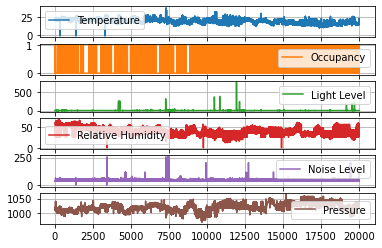

In [9]:
# Visualize the distribution of the features
df.plot(grid=True, subplots=True)
plt.legend(loc='best')

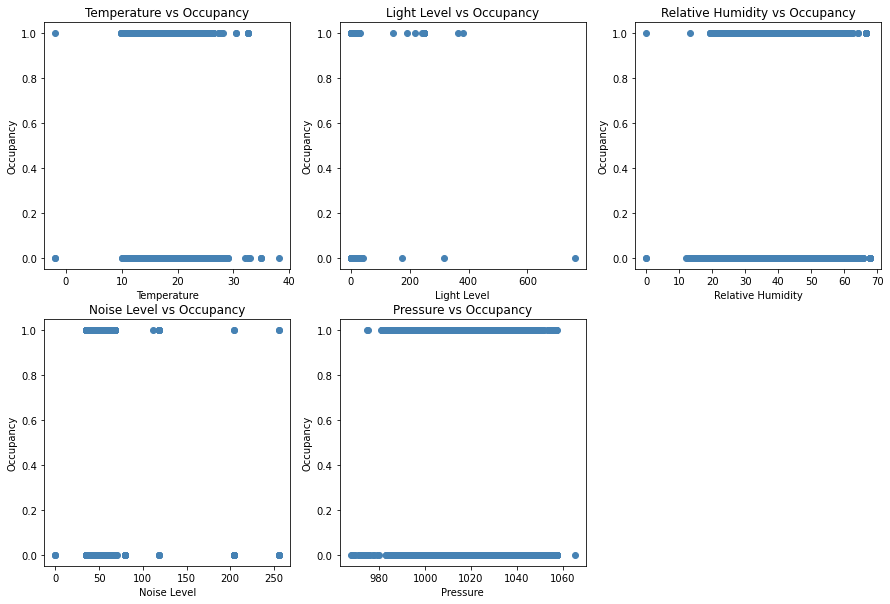

In [10]:
# Visualize the relevance between the label and features
plt.figure(figsize=(15,10))

plt.subplot(231)
plt.scatter(x = df['Temperature'],
            y = df['Occupancy'],
            color = 'steelblue'
           )
plt.xlabel('Temperature')
plt.ylabel('Occupancy')
plt.title('Temperature vs Occupancy')


plt.subplot(232)
plt.scatter(x = df['Light Level'],
            y = df['Occupancy'],
            color = 'steelblue'
           )
plt.xlabel('Light Level')
plt.ylabel('Occupancy')
plt.title('Light Level vs Occupancy')

plt.subplot(233)
plt.scatter(x = df['Relative Humidity'],
            y = df['Occupancy'],
            color = 'steelblue'
           )
plt.xlabel('Relative Humidity')
plt.ylabel('Occupancy')
plt.title('Relative Humidity vs Occupancy')

plt.subplot(234)
plt.scatter(x = df['Noise Level'],
            y = df['Occupancy'],
            color = 'steelblue'
           )
plt.xlabel('Noise Level')
plt.ylabel('Occupancy')
plt.title('Noise Level vs Occupancy')

plt.subplot(235)
plt.scatter(x = df['Pressure'],
            y = df['Occupancy'],
            color = 'steelblue'
           )
plt.xlabel('Pressure')
plt.ylabel('Occupancy')
plt.title('Pressure vs Occupancy')

plt.show()

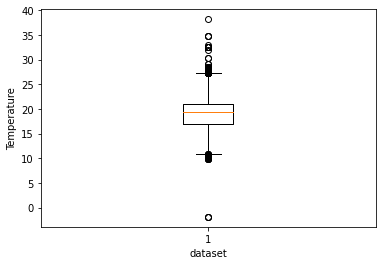

There are 61 error value in Temperature.


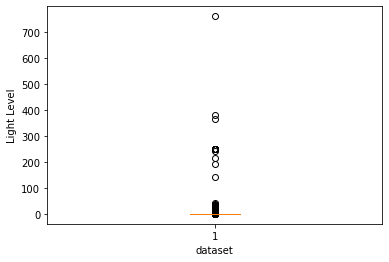

There are 23 error value in Light Level.


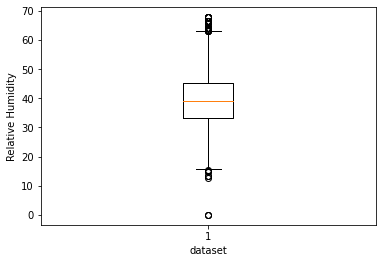

There are 31 error value in Relative Humidity.


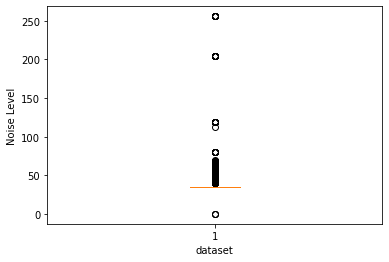

There are 79 error value in Noise Level.


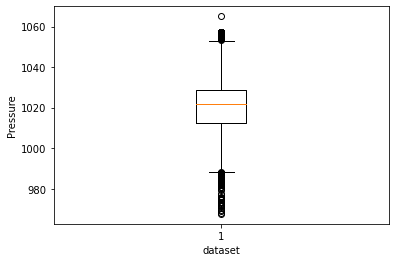

There are 40 error value in Pressure.


In [11]:
for x in df.columns:
    if x == 'Occupancy':
        continue
    
    plt.boxplot(df[x])
    plt.ylabel(x)
    plt.xlabel("dataset")
    plt.show()

    u = df[x].mean()  # calculate the mean
    std = df[x].std()  # calculate the standard deviation
    # filter and drop the error value
    error = df[x][np.abs(df[x] - u) > 3*std]
    df = df[np.abs(df[x] - u) <= 3*std]
    print(f'There are {len(error)} error value in {x}.')

## Infer from the preprocessed data

In [12]:
df

,Temperature,Occupancy,Light Level,Relative Humidity,Noise Level,Pressure
0,23.5,0,4.26,45.6,35,1011.277568
1,23.4,0,0.00,37.6,35,1013.302419
2,23.2,0,0.00,37.6,35,1012.818658
3,23.2,0,0.00,37.6,35,1012.818658
4,22.6,0,0.29,45.4,35,1010.561882
...,...,...,...,...,...,...
19995,22.0,1,0.42,32.9,48,1016.971276
19996,18.5,0,0.00,41.5,40,1027.837313
19997,17.1,0,1.08,45.1,40,1026.894572
19998,18.5,0,0.00,43.4,41,1027.938113


In [13]:
x_train, x_test, y_train, y_test = train_test_split(
        df.iloc[:, [0,2,3,4,5]], df.iloc[:, 1], train_size=0.7, random_state=2021)

In [27]:
def train_model(x_train, y_train, model):
    """Train the supervised learning classifier (LinearSVM or RandomForest) with the training set

    Args:
        x_train, y_train : training set
        model (String): the name of the classifier to use (LinearSVM or RandomForest)

    Returns:
        acc_train: the prediction accuracy on the training set
        clf: the classifier
    """
    logging.info('==========[Model training starts]==========')
    logging.info(f'[Model]: {model}')

    start_time = time.time()

    # The name of the model, e.g. A1_LinearSVM_model.pkl
    model_name = model + '_model.pkl'
    clf_path = os.path.join(home_dir, 'models', model_name)

    # Load the model if it exists
    try:
        clf = joblib.load(clf_path)
        logging.info(f'[Model]: Trained model has been found: {clf_path}')
    except:
        logging.info('[Model]: No model has been found for this task.')
        logging.info('Starting to train a new one...')

        # Use SVM with linear kernel as the classifier
        if model == 'LinearSVM':
            pipeline = make_pipeline(
                StandardScaler(),
                LinearSVC(
                    random_state=2021,
                    max_iter=10000,
                    tol=1e-3  # tolerance for stopping criteria
                )
            )

            param_grid = [{'linearsvc__C': [0.1, 1, 10, 100]}]

            # Find the best hyperparameter for the classifier bt using grid search
            clf = GridSearchCV(
                pipeline,
                param_grid,
                cv=5,  # K-fold cross-validation
                n_jobs=-1,  # Use all computing power
                verbose=50,  # Verbosity control
                return_train_score=True
            )

        # Use Random Forest as the classifier
        if model == 'RandomForest':
            param_grid = [{
                # number of trees in the random forest
                'n_estimators': range(1, 102, 10),  # 1-101, step by 10
                'max_features': range(1, 11, 1),  # 1-10
            }]

            # Find the best hyperparameter for the classifier bt using grid search
            clf = GridSearchCV(
                RandomForestClassifier(),
                param_grid,
                cv=5,  # K-fold cross-validation
                n_jobs=-1,  # Use all computing power
                verbose=50,  # Verbosity control
                return_train_score=True
            )

        clf.fit(x_train, y_train)

        # Save the model to a local file
        with open(clf_path, 'wb') as f:
            joblib.dump(clf, f)

    end_time = time.time()
    elapsed_time = end_time - start_time

    logging.info('====================')
    logging.debug(f'[Classifier used]: {clf}')
    logging.debug(f'[Best Estimator]: {clf.best_estimator_}')
    logging.info(f'[Best Parameters]: {clf.best_params_}')
    logging.info(f'[Best Test Score]: {clf.best_score_}')
    logging.info("[Best Training Score]: {}".format(
        clf.cv_results_['mean_train_score'][clf.best_index_]))
    logging.debug("[All Training Scores]: {}".format(
        clf.cv_results_['mean_train_score']))
    logging.debug("[All Test Scores]: {}".format(
        clf.cv_results_['mean_test_score']))

    # Print the feature importance in descending order
    if model == 'RandomForest':
        columns = ['Temperature',	'Light Level',	'Relative Humidity',	'Noise Level',	'Pressure']
        feature_selection = sorted(
            zip(clf.best_estimator_.feature_importances_, columns), reverse=True)
        
        ##### for ploting only #####
        # Plot the importances of features
        importances = clf.best_estimator_.feature_importances_
        indices = np.argsort(importances)
        plt.title('Feature Importances')
        plt.barh(range(len(indices)), importances[indices], color='b', align='center')
        plt.yticks(range(len(indices)), [columns[i] for i in indices])
        plt.xlabel('Relative Importance')
        plt.show()

        logging.info(f'[Feature Importances]: {feature_selection}')

    ##### for ploting only #####
    _, axes = plt.subplots(3, 1, figsize=(10, 15))

    title = "Learning Curve (SVM with linear kernel)"
    # title = "Learning Curve (Random Forest)"

    # Cross validation with 100 iterations to get smoother mean test and train
    # score curves, each time with 30% data randomly selected as a validation set.
    cv = ShuffleSplit(n_splits=100, test_size=0.3, random_state=2021)
    plot_learning_curve(clf, title, x_train, y_train,
                        axes=axes, ylim=(0.7, 1.01), n_jobs=-1)

    logging.info(
        f'[Execution time]: {time.strftime("%H:%M:%S", time.gmtime(elapsed_time))}')
    logging.info('==========[Model training ends]==========')

    acc_train = clf.cv_results_['mean_train_score'][clf.best_index_]
    acc_val = clf.best_score_
    return acc_train, clf

In [15]:
def plot_learning_curve(estimator, title, X, y, axes=None, ylim=None, cv=None,
                        n_jobs=None, train_sizes=np.linspace(.1, 1.0, 5)):
    """Generate 3 plots: the test and training learning curve, the training
        samples vs fit times curve, the fit times vs score curve.
        The code is provided on skikit-learn website
        (https://scikit-learn.org/stable/auto_examples/model_selection/plot_learning_curve.html).

    Args:
    ----------
    estimator : object type that implements the "fit" and "predict" methods
        An object of that type which is cloned for each validation.

    title : string
        Title for the chart.

    X : array-like, shape (n_samples, n_features)
        Training vector, where n_samples is the number of samples and
        n_features is the number of features.

    y : array-like, shape (n_samples) or (n_samples, n_features), optional
        Target relative to X for classification or regression;
        None for unsupervised learning.

    axes : array of 3 axes, optional (default=None)
        Axes to use for plotting the curves.

    ylim : tuple, shape (ymin, ymax), optional
        Defines minimum and maximum yvalues plotted.

    cv : int, cross-validation generator or an iterable, optional
        Determines the cross-validation splitting strategy.
        Possible inputs for cv are:
          - None, to use the default 5-fold cross-validation,
          - integer, to specify the number of folds.
          - :term:`CV splitter`,
          - An iterable yielding (train, test) splits as arrays of indices.

        For integer/None inputs, if ``y`` is binary or multiclass,
        :class:`StratifiedKFold` used. If the estimator is not a classifier
        or if ``y`` is neither binary nor multiclass, :class:`KFold` is used.

        Refer :ref:`User Guide <cross_validation>` for the various
        cross-validators that can be used here.

    n_jobs : int or None, optional (default=None)
        Number of jobs to run in parallel.
        ``None`` means 1 unless in a :obj:`joblib.parallel_backend` context.
        ``-1`` means using all processors. See :term:`Glossary <n_jobs>`
        for more details.

    train_sizes : array-like, shape (n_ticks,), dtype float or int
        Relative or absolute numbers of training examples that will be used to
        generate the learning curve. If the dtype is float, it is regarded as a
        fraction of the maximum size of the training set (that is determined
        by the selected validation method), i.e. it has to be within (0, 1].
        Otherwise it is interpreted as absolute sizes of the training sets.
        Note that for classification the number of samples usually have to
        be big enough to contain at least one sample from each class.
        (default: np.linspace(0.1, 1.0, 5))
    """
    if axes is None:
        _, axes = plt.subplots(1, 3, figsize=(20, 5))

    axes[0].set_title(title)
    if ylim is not None:
        axes[0].set_ylim(*ylim)
    axes[0].set_xlabel("Training examples")
    axes[0].set_ylabel("Score")

    train_sizes, train_scores, test_scores, fit_times, _ = \
        learning_curve(estimator, X, y, cv=cv, n_jobs=n_jobs,
                       train_sizes=train_sizes, verbose=3,
                       return_times=True)
    train_scores_mean = np.mean(train_scores, axis=1)
    train_scores_std = np.std(train_scores, axis=1)
    test_scores_mean = np.mean(test_scores, axis=1)
    test_scores_std = np.std(test_scores, axis=1)
    fit_times_mean = np.mean(fit_times, axis=1)
    fit_times_std = np.std(fit_times, axis=1)

    # Plot learning curve
    axes[0].grid()
    axes[0].fill_between(train_sizes, train_scores_mean - train_scores_std,
                         train_scores_mean + train_scores_std, alpha=0.1,
                         color="r")
    axes[0].fill_between(train_sizes, test_scores_mean - test_scores_std,
                         test_scores_mean + test_scores_std, alpha=0.1,
                         color="g")
    axes[0].plot(train_sizes, train_scores_mean, 'o-', color="r",
                 label="Training score")
    axes[0].plot(train_sizes, test_scores_mean, 'o-', color="g",
                 label="Cross-validation score")
    axes[0].legend(loc="best")

    # Plot n_samples vs fit_times
    axes[1].grid()
    axes[1].plot(train_sizes, fit_times_mean, 'o-')
    axes[1].fill_between(train_sizes, fit_times_mean - fit_times_std,
                         fit_times_mean + fit_times_std, alpha=0.1)
    axes[1].set_xlabel("Training examples")
    axes[1].set_ylabel("fit_times")
    axes[1].set_title("Scalability of the model")

    # Plot fit_time vs score
    axes[2].grid()
    axes[2].plot(fit_times_mean, test_scores_mean, 'o-')
    axes[2].fill_between(fit_times_mean, test_scores_mean - test_scores_std,
                         test_scores_mean + test_scores_std, alpha=0.1)
    axes[2].set_xlabel("fit_times")
    axes[2].set_ylabel("Score")
    axes[2].set_title("Performance of the model")

    plt.show()

In [16]:
def plot_binary_confusion_matrix(clf, x_test, y_test, class_names):
    """Plot confusion matrix

    Args:
        clf: the classifier
        x_test, y_test: the testing set
        class_names (List): a list of the class names, e.g. Male, Female
    """
    np.set_printoptions(precision=2)
    pred = clf.predict(x_test)

    # Plot confusion matrix
    titles_options = [("Non-normalized confusion matrix", None),
                      ("Normalized confusion matrix", 'true')]
    for title, normalize in titles_options:
        disp = plot_confusion_matrix(clf, x_test, y_test,
                                     display_labels=class_names,
                                     normalize=normalize)
        disp.ax_.set_title(title)

        logging.info(title)
        logging.info(disp.confusion_matrix)

    logging.info(f'[Accuracy of classifier]: {accuracy_score(y_test, pred)}')
    logging.info(
        f'[Classification report]: {classification_report(y_test, pred)}')
    plt.show()

In [17]:
def plot_ROC(clf, x_test, y_test):
    """Plot the ROC curve

    Args:
        clf: the classifier
        x_test, y_test: testing set
    """
    # Learn to predict each class against the other
    y_score = clf.decision_function(x_test)

    # Compute ROC curve and ROC area for each class
    fpr, tpr, _ = roc_curve(y_test,  y_score)
    auc = roc_auc_score(y_test, y_score)

    plt.plot(fpr, tpr, label="ROC curve, auc="+str(round(auc, 2)))
    plt.plot(np.linspace(0, 1, 10), np.linspace(0, 1, 10), label="diagonal")
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate, FPR')
    plt.ylabel('True Positive Rate, TPR')
    plt.title('Receiver Operating Characteristic(ROC) Curve')
    plt.legend(loc="lower right")
    plt.show()

[learning_curve] Training set sizes: [ 1106  3597  6087  8577 11068]


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.


Fitting 5 folds for each of 4 candidates, totalling 20 fits
Fitting 5 folds for each of 4 candidates, totalling 20 fits
Fitting 5 folds for each of 4 candidates, totalling 20 fits
Fitting 5 folds for each of 4 candidates, totalling 20 fits
Fitting 5 folds for each of 4 candidates, totalling 20 fits
Fitting 5 folds for each of 4 candidates, totalling 20 fits
Fitting 5 folds for each of 4 candidates, totalling 20 fits
[CV 1/5; 1/4] START linearsvc__C=0.1............................................
[CV 1/5; 1/4] START linearsvc__C=0.1............................................
[CV 2/5; 1/4] START linearsvc__C=0.1............................................
[CV 3/5; 1/4] START linearsvc__C=0.1............................................
[CV 1/5; 1/4] START linearsvc__C=0.1............................................
[CV 1/5; 1/4] START linearsvc__C=0.1............................................
[CV 4/5; 1/4] START linearsvc__C=0.1............................................
[CV 2/5; 1/4]

/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


[CV 1/5; 3/4] END linearsvc__C=10;, score=(train=0.873, test=0.869) total time=   4.7s
[CV 4/5; 4/4] START linearsvc__C=100............................................
[CV 2/5; 1/4] END linearsvc__C=0.1;, score=(train=0.871, test=0.872) total time=   5.0s
[CV 4/5; 2/4] START linearsvc__C=1..............................................
[CV 3/5; 3/4] END linearsvc__C=10;, score=(train=0.864, test=0.864) total time=   4.4s
[CV 4/5; 4/4] START linearsvc__C=100............................................


/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


[CV 3/5; 3/4] END linearsvc__C=10;, score=(train=0.872, test=0.873) total time=   4.7s
[CV 5/5; 4/4] START linearsvc__C=100............................................
[CV 2/5; 3/4] END linearsvc__C=10;, score=(train=0.872, test=0.873) total time=   4.9s
[CV 1/5; 3/4] END linearsvc__C=10;, score=(train=0.865, test=0.860) total time=   4.9s
[CV 5/5; 4/4] START linearsvc__C=100............................................


/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


[CV 4/5; 3/4] END linearsvc__C=10;, score=(train=0.872, test=0.873) total time=   4.7s
[CV 2/5; 1/4] END linearsvc__C=0.1;, score=(train=0.874, test=0.874) total time=   5.6s
[CV 4/5; 2/4] START linearsvc__C=1..............................................
[CV 3/5; 1/4] END linearsvc__C=0.1;, score=(train=0.874, test=0.875) total time=   5.6s
[CV 5/5; 2/4] START linearsvc__C=1..............................................
[CV 4/5; 1/4] END linearsvc__C=0.1;, score=(train=0.874, test=0.875) total time=   5.5s
[CV 1/5; 3/4] START linearsvc__C=10.............................................
[CV 5/5; 1/4] END linearsvc__C=0.1;, score=(train=0.874, test=0.874) total time=   5.6s
[CV 2/5; 3/4] START linearsvc__C=10.............................................
[CV 2/5; 3/4] END linearsvc__C=10;, score=(train=0.864, test=0.860) total time=   5.1s
[CV 1/5; 1/4] END linearsvc__C=0.1;, score=(train=0.875, test=0.873) total time=   5.8s
[CV 3/5; 3/4] START linearsvc__C=10...........................

/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


[CV 5/5; 3/4] END linearsvc__C=10;, score=(train=0.863, test=0.864) total time=   4.8s
[CV 1/5; 4/4] END linearsvc__C=100;, score=(train=0.863, test=0.860) total time=   4.9s


/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


[CV 2/5; 4/4] END linearsvc__C=100;, score=(train=0.864, test=0.860) total time=   4.5s
[CV 3/5; 4/4] END linearsvc__C=100;, score=(train=0.866, test=0.873) total time=   4.6s
[CV 4/5; 1/4] END linearsvc__C=0.1;, score=(train=0.871, test=0.872) total time=   7.4s
[CV 2/5; 4/4] END linearsvc__C=100;, score=(train=0.871, test=0.873) total time=   4.3s
[CV 5/5; 3/4] END linearsvc__C=10;, score=(train=0.868, test=0.860) total time=   4.6s
[CV 1/5; 3/4] START linearsvc__C=10.............................................
[CV 1/5; 4/4] END linearsvc__C=100;, score=(train=0.873, test=0.869) total time=   4.6s


/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


[CV 3/5; 4/4] END linearsvc__C=100;, score=(train=0.871, test=0.873) total time=   4.5s
[CV 1/5; 1/4] END linearsvc__C=0.1;, score=(train=0.871, test=0.870) total time=   8.1s
[CV 2/5; 3/4] START linearsvc__C=10.............................................
[CV 5/5; 1/4] END linearsvc__C=0.1;, score=(train=0.872, test=0.869) total time=   8.6s
[CV 3/5; 3/4] START linearsvc__C=10.............................................
[CV 3/5; 2/4] END linearsvc__C=1;, score=(train=0.877, test=0.876) total time=   8.4s
[CV 5/5; 3/4] START linearsvc__C=10.............................................
[CV 4/5; 4/4] END linearsvc__C=100;, score=(train=0.871, test=0.873) total time=   3.8s


/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


[CV 4/5; 4/4] END linearsvc__C=100;, score=(train=0.864, test=0.864) total time=   3.9s
[CV 5/5; 4/4] END linearsvc__C=100;, score=(train=0.868, test=0.860) total time=   3.7s


/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


[CV 5/5; 4/4] END linearsvc__C=100;, score=(train=0.862, test=0.869) total time=   3.9s
[CV] END ..................., score=(train=0.873, test=0.873) total time=   9.3s
[CV] END ..................., score=(train=0.866, test=0.870) total time=   9.4s
Fitting 5 folds for each of 4 candidates, totalling 20 fits
Fitting 5 folds for each of 4 candidates, totalling 20 fits
[CV 1/5; 1/4] START linearsvc__C=0.1............................................[CV 2/5; 1/4] START linearsvc__C=0.1............................................

[CV 3/5; 1/4] START linearsvc__C=0.1............................................[CV 4/5; 1/4] START linearsvc__C=0.1............................................

[CV 5/5; 1/4] START linearsvc__C=0.1............................................[CV 1/5; 2/4] START linearsvc__C=1..............................................
[CV 2/5; 2/4] START linearsvc__C=1..............................................
[CV 3/5; 2/4] START linearsvc__C=1..............................

/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


[CV 2/5; 2/4] END linearsvc__C=1;, score=(train=0.875, test=0.872) total time=  18.1s
[CV 3/5; 4/4] START linearsvc__C=100............................................
[CV 1/5; 1/4] END linearsvc__C=0.1;, score=(train=0.871, test=0.874) total time=   9.0s
[CV 3/5; 3/4] START linearsvc__C=10.............................................


/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


[CV 1/5; 3/4] END linearsvc__C=10;, score=(train=0.874, test=0.875) total time=  18.0s
[CV 4/5; 4/4] START linearsvc__C=100............................................
[CV 3/5; 3/4] END linearsvc__C=10;, score=(train=0.878, test=0.876) total time=  17.6s
[CV 4/5; 4/4] START linearsvc__C=100............................................


/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


[CV 1/5; 3/4] END linearsvc__C=10;, score=(train=0.877, test=0.876) total time=  17.9s
[CV 5/5; 4/4] START linearsvc__C=100............................................
[CV 3/5; 3/4] END linearsvc__C=10;, score=(train=0.875, test=0.873) total time=  17.4s
[CV 5/5; 4/4] START linearsvc__C=100............................................[CV 2/5; 3/4] END linearsvc__C=10;, score=(train=0.877, test=0.878) total time=  17.8s



/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


[CV 2/5; 3/4] END linearsvc__C=10;, score=(train=0.875, test=0.872) total time=  18.4s
[CV 2/5; 2/4] END linearsvc__C=1;, score=(train=0.874, test=0.870) total time=  22.8s
[CV 4/5; 3/4] START linearsvc__C=10.............................................


/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


[CV 4/5; 3/4] END linearsvc__C=10;, score=(train=0.877, test=0.879) total time=  17.6s
[CV 4/5; 2/4] END linearsvc__C=1;, score=(train=0.875, test=0.873) total time=  22.9s
[CV 5/5; 3/4] START linearsvc__C=10.............................................
[CV 2/5; 2/4] END linearsvc__C=1;, score=(train=0.874, test=0.876) total time=  23.8s
[CV 1/5; 4/4] START linearsvc__C=100............................................


/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


[CV 3/5; 2/4] END linearsvc__C=1;, score=(train=0.875, test=0.873) total time=  26.9s
[CV 2/5; 4/4] START linearsvc__C=100............................................
[CV 5/5; 3/4] END linearsvc__C=10;, score=(train=0.878, test=0.875) total time=  18.7s


/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


[CV 1/5; 4/4] END linearsvc__C=100;, score=(train=0.877, test=0.875) total time=  17.9s
[CV 5/5; 2/4] END linearsvc__C=1;, score=(train=0.874, test=0.875) total time=  25.6s
[CV 3/5; 4/4] START linearsvc__C=100............................................


/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


[CV 2/5; 4/4] END linearsvc__C=100;, score=(train=0.877, test=0.878) total time=  18.0s


/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


[CV 4/5; 3/4] END linearsvc__C=10;, score=(train=0.874, test=0.875) total time=  18.8s
[CV 3/5; 4/4] END linearsvc__C=100;, score=(train=0.876, test=0.879) total time=  18.4s


/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


[CV 1/5; 2/4] END linearsvc__C=1;, score=(train=0.873, test=0.873) total time=  31.8s
[CV 5/5; 3/4] START linearsvc__C=10.............................................
[CV 5/5; 3/4] END linearsvc__C=10;, score=(train=0.874, test=0.876) total time=  18.6s
[CV 4/5; 2/4] END linearsvc__C=1;, score=(train=0.873, test=0.873) total time=  29.8s
[CV 1/5; 4/4] START linearsvc__C=100............................................


/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


[CV 1/5; 4/4] END linearsvc__C=100;, score=(train=0.874, test=0.875) total time=  18.1s


/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


[CV 3/5; 2/4] END linearsvc__C=1;, score=(train=0.873, test=0.873) total time=  34.9s
[CV 2/5; 4/4] START linearsvc__C=100............................................
[CV 2/5; 4/4] END linearsvc__C=100;, score=(train=0.875, test=0.872) total time=  18.2s


/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


[CV 3/5; 4/4] END linearsvc__C=100;, score=(train=0.874, test=0.873) total time=  17.2s


/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


[CV 4/5; 4/4] END linearsvc__C=100;, score=(train=0.877, test=0.876) total time=  17.0s
[CV 5/5; 4/4] END linearsvc__C=100;, score=(train=0.877, test=0.875) total time=  16.8s
[CV 4/5; 4/4] END linearsvc__C=100;, score=(train=0.874, test=0.875) total time=  17.3s
[CV 5/5; 4/4] END linearsvc__C=100;, score=(train=0.874, test=0.875) total time=  17.1s


/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


[CV 2/5; 3/4] END linearsvc__C=10;, score=(train=0.875, test=0.875) total time=  33.6s
[CV 4/5; 4/4] START linearsvc__C=100............................................
[CV 3/5; 3/4] END linearsvc__C=10;, score=(train=0.875, test=0.873) total time=  33.4s
[CV 5/5; 4/4] START linearsvc__C=100............................................


/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


[CV 1/5; 3/4] END linearsvc__C=10;, score=(train=0.875, test=0.874) total time=  34.2s


/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


[CV 5/5; 2/4] END linearsvc__C=1;, score=(train=0.872, test=0.875) total time=  34.6s
[CV 3/5; 4/4] START linearsvc__C=100............................................


/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


[CV 1/5; 3/4] END linearsvc__C=10;, score=(train=0.873, test=0.873) total time=  34.6s
[CV 4/5; 4/4] START linearsvc__C=100............................................
[CV 3/5; 3/4] END linearsvc__C=10;, score=(train=0.873, test=0.873) total time=  34.5s
[CV 5/5; 4/4] START linearsvc__C=100............................................


/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


[CV 2/5; 3/4] END linearsvc__C=10;, score=(train=0.874, test=0.871) total time=  35.5s


/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


[CV 4/5; 3/4] END linearsvc__C=10;, score=(train=0.875, test=0.873) total time=  33.5s


/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


[CV 1/5; 2/4] END linearsvc__C=1;, score=(train=0.875, test=0.873) total time=  52.6s
[CV 4/5; 3/4] START linearsvc__C=10.............................................


/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


[CV 2/5; 2/4] END linearsvc__C=1;, score=(train=0.874, test=0.874) total time=  53.2s
[CV 5/5; 3/4] START linearsvc__C=10.............................................
[CV 3/5; 2/4] END linearsvc__C=1;, score=(train=0.875, test=0.875) total time=  43.9s
[CV 4/5; 3/4] START linearsvc__C=10.............................................


/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


[CV] END ..................., score=(train=0.877, test=0.870) total time=  54.3s
Fitting 5 folds for each of 4 candidates, totalling 20 fits
[CV 1/5; 1/4] START linearsvc__C=0.1............................................
[CV 2/5; 1/4] START linearsvc__C=0.1............................................[CV 3/5; 1/4] START linearsvc__C=0.1............................................
[CV 4/5; 1/4] START linearsvc__C=0.1............................................

[CV 5/5; 1/4] START linearsvc__C=0.1............................................[CV 1/5; 2/4] START linearsvc__C=1..............................................
[CV 2/5; 2/4] START linearsvc__C=1..............................................
[CV 3/5; 2/4] START linearsvc__C=1..............................................

[CV 2/5; 1/4] END linearsvc__C=0.1;, score=(train=0.864, test=0.860) total time=   0.1s
[CV 4/5; 2/4] START linearsvc__C=1..............................................
[CV 5/5; 1/4] END linearsvc__C=0.1;, score

/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


[CV] END ..................., score=(train=0.874, test=0.874) total time=  55.0s
[CV 4/5; 1/4] END linearsvc__C=0.1;, score=(train=0.867, test=0.869) total time=   0.2s
[CV 2/5; 3/4] START linearsvc__C=10.............................................
[CV 3/5; 1/4] END linearsvc__C=0.1;, score=(train=0.866, test=0.873) total time=   0.3s
[CV 3/5; 3/4] START linearsvc__C=10.............................................
Fitting 5 folds for each of 4 candidates, totalling 20 fits
[CV 1/5; 1/4] START linearsvc__C=0.1............................................
[CV 2/5; 1/4] START linearsvc__C=0.1............................................[CV 3/5; 1/4] START linearsvc__C=0.1............................................
[CV 4/5; 1/4] START linearsvc__C=0.1............................................
[CV 5/5; 1/4] START linearsvc__C=0.1............................................

[CV 1/5; 2/4] START linearsvc__C=1..............................................[CV 2/5; 2/4] START linearsvc__C=1..

/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


[CV 4/5; 3/4] END linearsvc__C=10;, score=(train=0.873, test=0.873) total time=  32.7s
[CV 1/5; 1/4] END linearsvc__C=0.1;, score=(train=0.872, test=0.868) total time=   0.2s
[CV 4/5; 2/4] START linearsvc__C=1..............................................
[CV 2/5; 2/4] END linearsvc__C=1;, score=(train=0.864, test=0.860) total time=   1.1s
[CV 4/5; 3/4] START linearsvc__C=10.............................................
[CV 3/5; 1/4] END linearsvc__C=0.1;, score=(train=0.872, test=0.872) total time=   0.7s
[CV 5/5; 2/4] START linearsvc__C=1..............................................
[CV 1/5; 2/4] END linearsvc__C=1;, score=(train=0.868, test=0.860) total time=   1.6s
[CV 5/5; 3/4] START linearsvc__C=10.............................................


/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


[CV 3/5; 2/4] END linearsvc__C=1;, score=(train=0.874, test=0.875) total time=  56.5s
[CV 1/5; 4/4] START linearsvc__C=100............................................
[CV 5/5; 1/4] END linearsvc__C=0.1;, score=(train=0.872, test=0.871) total time=   1.2s
[CV 1/5; 3/4] START linearsvc__C=10.............................................


/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


[CV 4/5; 1/4] END linearsvc__C=0.1;, score=(train=0.872, test=0.872) total time=   1.4s
[CV 2/5; 3/4] START linearsvc__C=10.............................................
[CV 3/5; 2/4] END linearsvc__C=1;, score=(train=0.866, test=0.873) total time=   2.1s
[CV 1/5; 4/4] START linearsvc__C=100............................................
[CV 4/5; 2/4] END linearsvc__C=1;, score=(train=0.867, test=0.869) total time=   1.9s
[CV 2/5; 4/4] START linearsvc__C=100............................................
[CV 2/5; 1/4] END linearsvc__C=0.1;, score=(train=0.872, test=0.874) total time=   1.6s
[CV 3/5; 3/4] START linearsvc__C=10.............................................
[CV 5/5; 3/4] END linearsvc__C=10;, score=(train=0.875, test=0.875) total time=  32.9s
[CV 1/5; 4/4] END linearsvc__C=100;, score=(train=0.874, test=0.874) total time=  32.7s


/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


[CV 5/5; 2/4] END linearsvc__C=1;, score=(train=0.867, test=0.869) total time=   2.4s
[CV 3/5; 4/4] START linearsvc__C=100............................................
[CV 4/5; 2/4] END linearsvc__C=1;, score=(train=0.875, test=0.876) total time=  45.7s
[CV 5/5; 3/4] START linearsvc__C=10.............................................
[CV 1/5; 2/4] END linearsvc__C=1;, score=(train=0.872, test=0.868) total time=   3.8s
[CV 4/5; 3/4] START linearsvc__C=10.............................................
[CV 5/5; 2/4] END linearsvc__C=1;, score=(train=0.876, test=0.874) total time=  45.9s
[CV 1/5; 4/4] START linearsvc__C=100............................................


/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


[CV 5/5; 2/4] END linearsvc__C=1;, score=(train=0.874, test=0.874) total time=  54.2s
[CV 2/5; 4/4] START linearsvc__C=100............................................
[CV 1/5; 3/4] END linearsvc__C=10;, score=(train=0.865, test=0.860) total time=   5.0s


/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


[CV 4/5; 4/4] START linearsvc__C=100............................................


/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


[CV 2/5; 3/4] END linearsvc__C=10;, score=(train=0.864, test=0.860) total time=   5.3s
[CV 5/5; 4/4] START linearsvc__C=100............................................
[CV 2/5; 3/4] END linearsvc__C=10;, score=(train=0.874, test=0.874) total time=  54.9s
[CV 3/5; 4/4] START linearsvc__C=100............................................
[CV 2/5; 4/4] END linearsvc__C=100;, score=(train=0.874, test=0.875) total time=  33.2s


/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


[CV 4/5; 2/4] END linearsvc__C=1;, score=(train=0.874, test=0.875) total time=  54.9s
[CV 4/5; 4/4] START linearsvc__C=100............................................
[CV 3/5; 3/4] END linearsvc__C=10;, score=(train=0.864, test=0.864) total time=   5.6s
[CV 1/5; 3/4] END linearsvc__C=10;, score=(train=0.875, test=0.872) total time=  55.1s
[CV 5/5; 4/4] START linearsvc__C=100............................................


/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


[CV 4/5; 3/4] END linearsvc__C=10;, score=(train=0.863, test=0.864) total time=   5.2s
[CV 2/5; 2/4] END linearsvc__C=1;, score=(train=0.875, test=0.875) total time=  51.6s
[CV 2/5; 4/4] START linearsvc__C=100............................................
[CV 3/5; 3/4] END linearsvc__C=10;, score=(train=0.874, test=0.875) total time=  55.3s


/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


[CV 3/5; 4/4] END linearsvc__C=100;, score=(train=0.875, test=0.873) total time=  33.3s


/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


[CV 5/5; 3/4] END linearsvc__C=10;, score=(train=0.863, test=0.869) total time=   5.3s
[CV 1/5; 4/4] END linearsvc__C=100;, score=(train=0.869, test=0.860) total time=   4.9s


/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


[CV 2/5; 4/4] END linearsvc__C=100;, score=(train=0.864, test=0.860) total time=   4.9s


/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


[CV 3/5; 4/4] END linearsvc__C=100;, score=(train=0.866, test=0.873) total time=   4.9s
[CV 1/5; 2/4] END linearsvc__C=1;, score=(train=0.876, test=0.876) total time=  54.3s
[CV 3/5; 4/4] START linearsvc__C=100............................................


/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


[CV 5/5; 3/4] END linearsvc__C=10;, score=(train=0.872, test=0.875) total time=  32.4s
[CV 4/5; 4/4] END linearsvc__C=100;, score=(train=0.864, test=0.864) total time=   4.1s


/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


[CV 5/5; 4/4] END linearsvc__C=100;, score=(train=0.863, test=0.869) total time=   4.0s
[CV] END ..................., score=(train=0.866, test=0.873) total time=   9.8s
Fitting 5 folds for each of 4 candidates, totalling 20 fits
[CV 1/5; 1/4] START linearsvc__C=0.1............................................[CV 2/5; 1/4] START linearsvc__C=0.1............................................

[CV 3/5; 1/4] START linearsvc__C=0.1............................................[CV 4/5; 1/4] START linearsvc__C=0.1............................................
[CV 5/5; 1/4] START linearsvc__C=0.1............................................

[CV 1/5; 2/4] START linearsvc__C=1..............................................
[CV 2/5; 2/4] START linearsvc__C=1..............................................
[CV 3/5; 2/4] START linearsvc__C=1..............................................


/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


[CV 1/5; 4/4] END linearsvc__C=100;, score=(train=0.873, test=0.873) total time=  32.8s
[CV 3/5; 1/4] END linearsvc__C=0.1;, score=(train=0.874, test=0.873) total time=   1.3s
[CV 4/5; 2/4] START linearsvc__C=1..............................................
[CV 5/5; 1/4] END linearsvc__C=0.1;, score=(train=0.874, test=0.873) total time=   1.2s
[CV 5/5; 2/4] START linearsvc__C=1..............................................
[CV 1/5; 1/4] END linearsvc__C=0.1;, score=(train=0.873, test=0.875) total time=   1.5s
[CV 1/5; 3/4] START linearsvc__C=10.............................................
[CV 5/5; 2/4] END linearsvc__C=1;, score=(train=0.872, test=0.871) total time=  10.2s
[CV 5/5; 3/4] START linearsvc__C=10.............................................
[CV 3/5; 2/4] END linearsvc__C=1;, score=(train=0.872, test=0.872) total time=  11.1s
[CV 1/5; 4/4] START linearsvc__C=100............................................
[CV 2/5; 1/4] END linearsvc__C=0.1;, score=(train=0.873, test=0.875) to

/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


[CV 1/5; 3/4] END linearsvc__C=10;, score=(train=0.875, test=0.876) total time=  54.4s
[CV 4/5; 4/4] START linearsvc__C=100............................................
[CV 2/5; 2/4] END linearsvc__C=1;, score=(train=0.872, test=0.874) total time=  13.1s
[CV 2/5; 4/4] START linearsvc__C=100............................................


/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


[CV 5/5; 4/4] END linearsvc__C=100;, score=(train=0.874, test=0.875) total time=  32.1s


/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


[CV 3/5; 3/4] END linearsvc__C=10;, score=(train=0.875, test=0.875) total time=  54.4s
[CV 5/5; 4/4] START linearsvc__C=100............................................
[CV 4/5; 2/4] END linearsvc__C=1;, score=(train=0.872, test=0.872) total time=  13.8s
[CV 3/5; 4/4] START linearsvc__C=100............................................
[CV 4/5; 4/4] END linearsvc__C=100;, score=(train=0.875, test=0.874) total time=  32.9s


/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


[CV 2/5; 3/4] END linearsvc__C=10;, score=(train=0.875, test=0.876) total time=  55.6s
[CV 3/5; 4/4] END linearsvc__C=100;, score=(train=0.873, test=0.874) total time=  32.6s
[CV 5/5; 4/4] END linearsvc__C=100;, score=(train=0.872, test=0.875) total time=  32.1s


/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


[CV 4/5; 4/4] END linearsvc__C=100;, score=(train=0.874, test=0.872) total time=  32.9s


/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


[CV 1/5; 3/4] END linearsvc__C=10;, score=(train=0.872, test=0.868) total time=  16.6s
[CV 4/5; 4/4] START linearsvc__C=100............................................


/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


[CV 2/5; 3/4] END linearsvc__C=10;, score=(train=0.873, test=0.874) total time=  17.1s
[CV 5/5; 4/4] START linearsvc__C=100............................................
[CV 3/5; 3/4] END linearsvc__C=10;, score=(train=0.873, test=0.872) total time=  17.0s


/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


[CV 4/5; 3/4] END linearsvc__C=10;, score=(train=0.872, test=0.875) total time=  15.7s


/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


[CV 1/5; 2/4] END linearsvc__C=1;, score=(train=0.871, test=0.870) total time= 1.3min
[CV 4/5; 3/4] START linearsvc__C=10.............................................
[CV 2/5; 2/4] END linearsvc__C=1;, score=(train=0.871, test=0.872) total time= 1.3min
[CV 5/5; 3/4] START linearsvc__C=10.............................................


/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


[CV 3/5; 2/4] END linearsvc__C=1;, score=(train=0.871, test=0.873) total time= 1.3min
[CV 1/5; 4/4] START linearsvc__C=100............................................


/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


[CV 4/5; 2/4] END linearsvc__C=1;, score=(train=0.871, test=0.872) total time= 1.3min
[CV 2/5; 4/4] START linearsvc__C=100............................................


/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


[CV 1/5; 4/4] END linearsvc__C=100;, score=(train=0.872, test=0.868) total time=  14.8s
[CV 5/5; 3/4] END linearsvc__C=10;, score=(train=0.873, test=0.871) total time=  15.1s


/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


[CV 2/5; 4/4] END linearsvc__C=100;, score=(train=0.872, test=0.874) total time=  14.2s


/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


[CV 5/5; 2/4] END linearsvc__C=1;, score=(train=0.872, test=0.869) total time= 1.3min
[CV 3/5; 4/4] START linearsvc__C=100............................................


/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


[CV 1/5; 3/4] END linearsvc__C=10;, score=(train=0.872, test=0.870) total time= 1.3min
[CV 4/5; 4/4] START linearsvc__C=100............................................


/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


[CV 4/5; 2/4] END linearsvc__C=1;, score=(train=0.872, test=0.872) total time= 1.2min
[CV 4/5; 3/4] START linearsvc__C=10.............................................
[CV 2/5; 3/4] END linearsvc__C=10;, score=(train=0.871, test=0.872) total time= 1.3min
[CV 5/5; 4/4] START linearsvc__C=100............................................
[CV 3/5; 4/4] END linearsvc__C=100;, score=(train=0.872, test=0.872) total time=  14.8s


/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


[CV 3/5; 3/4] END linearsvc__C=10;, score=(train=0.871, test=0.873) total time= 1.3min
[CV 3/5; 2/4] END linearsvc__C=1;, score=(train=0.874, test=0.873) total time=  20.4s
[CV 4/5; 3/4] START linearsvc__C=10.............................................
[CV 1/5; 2/4] END linearsvc__C=1;, score=(train=0.871, test=0.874) total time= 1.3min
[CV 5/5; 3/4] START linearsvc__C=10.............................................


/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


[CV 2/5; 2/4] END linearsvc__C=1;, score=(train=0.873, test=0.875) total time=  20.7s
[CV 5/5; 3/4] START linearsvc__C=10.............................................


/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


[CV 3/5; 2/4] END linearsvc__C=1;, score=(train=0.872, test=0.872) total time= 1.3min
[CV 1/5; 4/4] START linearsvc__C=100............................................
[CV 5/5; 2/4] END linearsvc__C=1;, score=(train=0.874, test=0.873) total time=  20.1s
[CV 1/5; 4/4] START linearsvc__C=100............................................
[CV 2/5; 2/4] END linearsvc__C=1;, score=(train=0.872, test=0.873) total time= 1.3min
[CV 2/5; 4/4] START linearsvc__C=100............................................
[CV 5/5; 2/4] END linearsvc__C=1;, score=(train=0.873, test=0.869) total time= 1.2min
[CV 3/5; 4/4] START linearsvc__C=100............................................


/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


[CV 4/5; 4/4] END linearsvc__C=100;, score=(train=0.871, test=0.872) total time=  14.0s


/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


[CV 5/5; 4/4] END linearsvc__C=100;, score=(train=0.873, test=0.871) total time=  13.9s
[CV 4/5; 2/4] END linearsvc__C=1;, score=(train=0.874, test=0.871) total time=  24.2s
[CV 2/5; 4/4] START linearsvc__C=100............................................


/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


[CV 2/5; 3/4] END linearsvc__C=10;, score=(train=0.872, test=0.874) total time= 1.2min
[CV 4/5; 4/4] START linearsvc__C=100............................................
[CV 1/5; 2/4] END linearsvc__C=1;, score=(train=0.873, test=0.875) total time=  26.6s
[CV 3/5; 4/4] START linearsvc__C=100............................................
[CV 1/5; 3/4] END linearsvc__C=10;, score=(train=0.872, test=0.874) total time= 1.2min
[CV 5/5; 4/4] START linearsvc__C=100............................................


/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


[CV 3/5; 3/4] END linearsvc__C=10;, score=(train=0.872, test=0.872) total time= 1.2min


/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


[CV 1/5; 3/4] END linearsvc__C=10;, score=(train=0.873, test=0.875) total time=  29.5s
[CV 4/5; 4/4] START linearsvc__C=100............................................


/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


[CV 3/5; 3/4] END linearsvc__C=10;, score=(train=0.873, test=0.873) total time=  28.7s
[CV 5/5; 4/4] START linearsvc__C=100............................................


/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


[CV 2/5; 3/4] END linearsvc__C=10;, score=(train=0.873, test=0.872) total time=  29.4s


/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


[CV 4/5; 3/4] END linearsvc__C=10;, score=(train=0.874, test=0.875) total time=  47.7s


/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


[CV 4/5; 3/4] END linearsvc__C=10;, score=(train=0.875, test=0.875) total time=  47.5s
[CV 5/5; 3/4] END linearsvc__C=10;, score=(train=0.874, test=0.874) total time=  47.9s


/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


[CV 1/5; 4/4] END linearsvc__C=100;, score=(train=0.875, test=0.871) total time=  45.7s


/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


[CV] END ..................., score=(train=0.872, test=0.873) total time=  47.3s
Fitting 5 folds for each of 4 candidates, totalling 20 fits
[CV 1/5; 1/4] START linearsvc__C=0.1............................................[CV 2/5; 1/4] START linearsvc__C=0.1............................................

[CV 3/5; 1/4] START linearsvc__C=0.1............................................
[CV 4/5; 1/4] START linearsvc__C=0.1............................................[CV 5/5; 1/4] START linearsvc__C=0.1............................................

[CV 1/5; 2/4] START linearsvc__C=1..............................................[CV 2/5; 2/4] START linearsvc__C=1..............................................
[CV 3/5; 2/4] START linearsvc__C=1..............................................



/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


[CV] END ..................., score=(train=0.874, test=0.871) total time= 1.7min
Fitting 5 folds for each of 4 candidates, totalling 20 fits
[CV 1/5; 1/4] START linearsvc__C=0.1............................................[CV 2/5; 1/4] START linearsvc__C=0.1............................................
[CV 3/5; 1/4] START linearsvc__C=0.1............................................
[CV 4/5; 1/4] START linearsvc__C=0.1............................................

[CV 5/5; 1/4] START linearsvc__C=0.1............................................
[CV 1/5; 2/4] START linearsvc__C=1..............................................[CV 2/5; 2/4] START linearsvc__C=1..............................................

[CV 3/5; 2/4] START linearsvc__C=1..............................................


/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


[CV 1/5; 4/4] END linearsvc__C=100;, score=(train=0.875, test=0.876) total time=  45.1s
[CV 2/5; 4/4] END linearsvc__C=100;, score=(train=0.874, test=0.874) total time=  44.8s


/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
[Parallel(n_jobs=-1)]: Done   8 out of  25 | elapsed:  1.8min remaining:  3.8min
/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


[CV] END ..................., score=(train=0.873, test=0.874) total time= 1.7min
[CV 5/5; 3/4] END linearsvc__C=10;, score=(train=0.876, test=0.873) total time=  46.1s
[CV 5/5; 1/4] END linearsvc__C=0.1;, score=(train=0.875, test=0.873) total time=   2.2s
[CV 4/5; 2/4] START linearsvc__C=1..............................................
Fitting 5 folds for each of 4 candidates, totalling 20 fits
[CV 1/5; 1/4] START linearsvc__C=0.1............................................[CV 2/5; 1/4] START linearsvc__C=0.1............................................
[CV 3/5; 1/4] START linearsvc__C=0.1............................................

[CV 4/5; 1/4] START linearsvc__C=0.1............................................[CV 5/5; 1/4] START linearsvc__C=0.1............................................
[CV 1/5; 2/4] START linearsvc__C=1..............................................

[CV 2/5; 2/4] START linearsvc__C=1..............................................[CV 3/5; 2/4] START linearsvc__C=1...

/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


[CV 3/5; 4/4] END linearsvc__C=100;, score=(train=0.875, test=0.874) total time=  45.0s
[CV 1/5; 1/4] END linearsvc__C=0.1;, score=(train=0.874, test=0.876) total time=   2.9s
[CV 1/5; 3/4] START linearsvc__C=10.............................................
[CV 2/5; 2/4] END linearsvc__C=1;, score=(train=0.864, test=0.860) total time=   0.6s
[CV 4/5; 3/4] START linearsvc__C=10.............................................
[CV 4/5; 4/4] END linearsvc__C=100;, score=(train=0.875, test=0.876) total time=  45.4s


/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


[CV 5/5; 4/4] END linearsvc__C=100;, score=(train=0.874, test=0.874) total time=  45.4s
[CV 4/5; 1/4] END linearsvc__C=0.1;, score=(train=0.874, test=0.875) total time=   3.4s
[CV 2/5; 3/4] START linearsvc__C=10.............................................


/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


[CV 2/5; 4/4] END linearsvc__C=100;, score=(train=0.875, test=0.876) total time=  45.2s
[CV 1/5; 2/4] END linearsvc__C=1;, score=(train=0.868, test=0.860) total time=   1.2s
[CV 5/5; 3/4] START linearsvc__C=10.............................................
[CV 3/5; 1/4] END linearsvc__C=0.1;, score=(train=0.875, test=0.872) total time=   3.8s
[CV 3/5; 3/4] START linearsvc__C=10.............................................
[CV 4/5; 2/4] END linearsvc__C=1;, score=(train=0.867, test=0.869) total time=   1.4s
[CV 1/5; 4/4] START linearsvc__C=100............................................
[CV 3/5; 2/4] END linearsvc__C=1;, score=(train=0.866, test=0.873) total time=   1.7s
[CV 2/5; 4/4] START linearsvc__C=100............................................
[CV 5/5; 2/4] END linearsvc__C=1;, score=(train=0.867, test=0.869) total time=   1.7s
[CV 3/5; 4/4] START linearsvc__C=100............................................
[CV 5/5; 1/4] END linearsvc__C=0.1;, score=(train=0.872, test=0.869) total 

/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


[CV 3/5; 4/4] END linearsvc__C=100;, score=(train=0.875, test=0.875) total time=  45.3s
[CV 2/5; 1/4] END linearsvc__C=0.1;, score=(train=0.871, test=0.872) total time=   5.4s
[CV 1/5; 3/4] START linearsvc__C=10.............................................


/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


[CV 1/5; 3/4] END linearsvc__C=10;, score=(train=0.865, test=0.860) total time=   4.0s
[CV 4/5; 4/4] START linearsvc__C=100............................................
[CV 3/5; 3/4] END linearsvc__C=10;, score=(train=0.864, test=0.864) total time=   4.0s
[CV 5/5; 4/4] START linearsvc__C=100............................................
[CV 2/5; 3/4] END linearsvc__C=10;, score=(train=0.864, test=0.860) total time=   4.1s


/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


[CV 4/5; 3/4] END linearsvc__C=10;, score=(train=0.863, test=0.864) total time=   3.7s
[CV 4/5; 1/4] END linearsvc__C=0.1;, score=(train=0.872, test=0.872) total time=   6.0s
[CV 2/5; 3/4] START linearsvc__C=10.............................................
[CV 1/5; 1/4] END linearsvc__C=0.1;, score=(train=0.871, test=0.874) total time=   6.4s
[CV 3/5; 3/4] START linearsvc__C=10.............................................


/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


[CV 5/5; 3/4] END linearsvc__C=10;, score=(train=0.863, test=0.869) total time=   4.0s
[CV 1/5; 4/4] END linearsvc__C=100;, score=(train=0.864, test=0.860) total time=   3.9s
[CV 3/5; 4/4] END linearsvc__C=100;, score=(train=0.866, test=0.864) total time=   3.8s


/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


[CV 2/5; 4/4] END linearsvc__C=100;, score=(train=0.864, test=0.860) total time=   3.9s


/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


[CV 5/5; 3/4] END linearsvc__C=10;, score=(train=0.874, test=0.873) total time=  26.3s
[CV] END ..................., score=(train=0.874, test=0.873) total time= 1.9min
[CV 4/5; 4/4] END linearsvc__C=100;, score=(train=0.875, test=0.876) total time=  43.6s
Fitting 5 folds for each of 4 candidates, totalling 20 fits
[CV 5/5; 4/4] END linearsvc__C=100;, score=(train=0.875, test=0.873) total time=  43.2s
[CV 1/5; 1/4] START linearsvc__C=0.1............................................[CV 2/5; 1/4] START linearsvc__C=0.1............................................

[CV 3/5; 1/4] START linearsvc__C=0.1............................................
[CV 4/5; 1/4] START linearsvc__C=0.1............................................
[CV 5/5; 1/4] START linearsvc__C=0.1............................................[CV 1/5; 2/4] START linearsvc__C=1..............................................
[CV 2/5; 2/4] START linearsvc__C=1..............................................

[CV 3/5; 2/4] START linearsvc

/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


[CV 1/5; 1/4] END linearsvc__C=0.1;, score=(train=0.872, test=0.868) total time=   0.1s
[CV 4/5; 2/4] START linearsvc__C=1..............................................
[CV 5/5; 4/4] END linearsvc__C=100;, score=(train=0.864, test=0.869) total time=   3.3s


/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


[CV 4/5; 4/4] END linearsvc__C=100;, score=(train=0.864, test=0.864) total time=   3.4s
[CV] END ..................., score=(train=0.866, test=0.872) total time=   7.7s
[CV 5/5; 1/4] END linearsvc__C=0.1;, score=(train=0.872, test=0.871) total time=   0.6s
[CV 5/5; 2/4] START linearsvc__C=1..............................................
[CV 3/5; 1/4] END linearsvc__C=0.1;, score=(train=0.872, test=0.872) total time=   0.6s
[CV 1/5; 3/4] START linearsvc__C=10.............................................


/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


[CV 2/5; 1/4] END linearsvc__C=0.1;, score=(train=0.872, test=0.874) total time=   0.7s
[CV 2/5; 3/4] START linearsvc__C=10.............................................
Fitting 5 folds for each of 4 candidates, totalling 20 fits
[CV 1/5; 4/4] END linearsvc__C=100;, score=(train=0.873, test=0.875) total time=  27.0s
[CV 1/5; 1/4] START linearsvc__C=0.1............................................[CV 2/5; 1/4] START linearsvc__C=0.1............................................

[CV 3/5; 1/4] START linearsvc__C=0.1............................................
[CV 4/5; 1/4] START linearsvc__C=0.1............................................
[CV 5/5; 1/4] START linearsvc__C=0.1............................................[CV 1/5; 2/4] START linearsvc__C=1..............................................

[CV 2/5; 2/4] START linearsvc__C=1..............................................
[CV 3/5; 2/4] START linearsvc__C=1..............................................
[CV 4/5; 1/4] END linearsvc__C=0.1;

/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


[CV 2/5; 4/4] END linearsvc__C=100;, score=(train=0.873, test=0.875) total time=  26.4s


/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


[CV 3/5; 4/4] END linearsvc__C=100;, score=(train=0.874, test=0.873) total time=  26.5s
[CV 3/5; 2/4] END linearsvc__C=1;, score=(train=0.872, test=0.872) total time=   9.7s
[CV 5/5; 3/4] START linearsvc__C=10.............................................
[CV 5/5; 2/4] END linearsvc__C=1;, score=(train=0.872, test=0.871) total time=   9.5s
[CV 1/5; 4/4] START linearsvc__C=100............................................


/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


[CV 5/5; 4/4] END linearsvc__C=100;, score=(train=0.873, test=0.873) total time=  26.5s
[CV 4/5; 4/4] END linearsvc__C=100;, score=(train=0.874, test=0.870) total time=  26.9s
[CV 2/5; 2/4] END linearsvc__C=1;, score=(train=0.872, test=0.874) total time=  11.3s
[CV 2/5; 4/4] START linearsvc__C=100............................................
[CV] END ..................., score=(train=0.874, test=0.873) total time=  59.5s
Fitting 5 folds for each of 4 candidates, totalling 20 fits
[CV 1/5; 1/4] START linearsvc__C=0.1............................................
[CV 2/5; 1/4] START linearsvc__C=0.1............................................
[CV 3/5; 1/4] START linearsvc__C=0.1............................................
[CV 4/5; 1/4] START linearsvc__C=0.1............................................
[CV 5/5; 1/4] START linearsvc__C=0.1............................................
[CV 1/5; 2/4] START linearsvc__C=1..............................................[CV 2/5; 2/4] START linearsvc__

/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


[CV 3/5; 3/4] END linearsvc__C=10;, score=(train=0.873, test=0.872) total time=  15.0s
[CV 5/5; 4/4] START linearsvc__C=100............................................


/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


[CV 2/5; 3/4] END linearsvc__C=10;, score=(train=0.873, test=0.874) total time=  15.9s
[CV 1/5; 1/4] END linearsvc__C=0.1;, score=(train=0.875, test=0.876) total time=   4.5s
[CV 3/5; 3/4] START linearsvc__C=10.............................................


/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


[CV 4/5; 3/4] END linearsvc__C=10;, score=(train=0.872, test=0.873) total time=  15.5s
[CV 3/5; 2/4] END linearsvc__C=1;, score=(train=0.874, test=0.873) total time=  20.8s
[CV 4/5; 3/4] START linearsvc__C=10.............................................
[CV 2/5; 2/4] END linearsvc__C=1;, score=(train=0.873, test=0.875) total time=  21.2s
[CV 5/5; 3/4] START linearsvc__C=10.............................................
[CV 5/5; 2/4] END linearsvc__C=1;, score=(train=0.874, test=0.873) total time=  20.2s
[CV 1/5; 4/4] START linearsvc__C=100............................................


/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


[CV 1/5; 4/4] END linearsvc__C=100;, score=(train=0.872, test=0.868) total time=  15.2s
[CV 5/5; 3/4] END linearsvc__C=10;, score=(train=0.874, test=0.871) total time=  15.5s


/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


[CV 2/5; 4/4] END linearsvc__C=100;, score=(train=0.872, test=0.874) total time=  15.2s
[CV 4/5; 2/4] END linearsvc__C=1;, score=(train=0.874, test=0.870) total time=  25.0s
[CV 2/5; 4/4] START linearsvc__C=100............................................


/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


[CV 3/5; 4/4] END linearsvc__C=100;, score=(train=0.872, test=0.872) total time=  15.2s
[CV 1/5; 2/4] END linearsvc__C=1;, score=(train=0.873, test=0.875) total time=  27.9s
[CV 3/5; 4/4] START linearsvc__C=100............................................


/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


[CV 5/5; 3/4] END linearsvc__C=10;, score=(train=0.872, test=0.869) total time= 1.1min


/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


[CV 4/5; 3/4] END linearsvc__C=10;, score=(train=0.871, test=0.872) total time= 1.1min


/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


[CV 4/5; 4/4] END linearsvc__C=100;, score=(train=0.871, test=0.872) total time=  15.0s


/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


[CV 1/5; 4/4] END linearsvc__C=100;, score=(train=0.872, test=0.870) total time= 1.1min
[CV 5/5; 4/4] END linearsvc__C=100;, score=(train=0.872, test=0.871) total time=  15.0s
[CV 4/5; 2/4] END linearsvc__C=1;, score=(train=0.874, test=0.875) total time=  39.0s
[CV 4/5; 3/4] START linearsvc__C=10.............................................
[CV 2/5; 2/4] END linearsvc__C=1;, score=(train=0.874, test=0.875) total time=  41.8s
[CV 5/5; 3/4] START linearsvc__C=10.............................................


/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


[CV 2/5; 3/4] END linearsvc__C=10;, score=(train=0.873, test=0.872) total time=  30.4s
[CV 4/5; 4/4] START linearsvc__C=100............................................
[CV 1/5; 3/4] END linearsvc__C=10;, score=(train=0.873, test=0.875) total time=  30.8s
[CV 5/5; 4/4] START linearsvc__C=100............................................
[CV 5/5; 2/4] END linearsvc__C=1;, score=(train=0.875, test=0.873) total time=  41.1s
[CV 1/5; 4/4] START linearsvc__C=100............................................


/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


[CV 2/5; 4/4] END linearsvc__C=100;, score=(train=0.871, test=0.872) total time= 1.1min


/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


[CV 3/5; 3/4] END linearsvc__C=10;, score=(train=0.874, test=0.873) total time=  31.4s
[CV 3/5; 2/4] END linearsvc__C=1;, score=(train=0.875, test=0.872) total time=  44.9s
[CV 2/5; 4/4] START linearsvc__C=100............................................


/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


[CV 3/5; 4/4] END linearsvc__C=100;, score=(train=0.871, test=0.873) total time= 1.1min


/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


[CV 4/5; 4/4] END linearsvc__C=100;, score=(train=0.871, test=0.872) total time= 1.1min


/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


[CV 4/5; 3/4] END linearsvc__C=10;, score=(train=0.872, test=0.872) total time= 1.1min


/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


[CV 5/5; 4/4] END linearsvc__C=100;, score=(train=0.872, test=0.870) total time= 1.1min


/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


[CV 2/5; 4/4] END linearsvc__C=100;, score=(train=0.872, test=0.873) total time= 1.1min
[CV 1/5; 4/4] END linearsvc__C=100;, score=(train=0.871, test=0.874) total time= 1.1min


/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


[CV 1/5; 2/4] END linearsvc__C=1;, score=(train=0.874, test=0.876) total time=  48.1s
[CV 3/5; 4/4] START linearsvc__C=100............................................


/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


[CV 3/5; 4/4] END linearsvc__C=100;, score=(train=0.872, test=0.872) total time= 1.1min


/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


[CV 5/5; 3/4] END linearsvc__C=10;, score=(train=0.873, test=0.869) total time= 1.1min


/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


[CV 2/5; 3/4] END linearsvc__C=10;, score=(train=0.874, test=0.875) total time=  47.2s
[CV 4/5; 4/4] START linearsvc__C=100............................................
[CV 3/5; 3/4] END linearsvc__C=10;, score=(train=0.875, test=0.872) total time=  46.9s
[CV 5/5; 4/4] START linearsvc__C=100............................................


/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


[CV 1/5; 3/4] END linearsvc__C=10;, score=(train=0.874, test=0.876) total time=  48.6s


/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


[CV 4/5; 4/4] END linearsvc__C=100;, score=(train=0.872, test=0.872) total time= 1.1min
[CV 5/5; 4/4] END linearsvc__C=100;, score=(train=0.873, test=0.869) total time= 1.1min


/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


[CV] END ..................., score=(train=0.872, test=0.872) total time=  45.7s
Fitting 5 folds for each of 4 candidates, totalling 20 fits
[CV 1/5; 1/4] START linearsvc__C=0.1............................................[CV 2/5; 1/4] START linearsvc__C=0.1............................................

[CV 3/5; 1/4] START linearsvc__C=0.1............................................[CV 4/5; 1/4] START linearsvc__C=0.1............................................
[CV 5/5; 1/4] START linearsvc__C=0.1............................................
[CV 1/5; 2/4] START linearsvc__C=1..............................................
[CV 2/5; 2/4] START linearsvc__C=1..............................................
[CV 3/5; 2/4] START linearsvc__C=1..............................................

[CV 2/5; 2/4] END linearsvc__C=1;, score=(train=0.875, test=0.874) total time=  35.6s
[CV 4/5; 3/4] START linearsvc__C=10.............................................


/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


[CV 4/5; 3/4] END linearsvc__C=10;, score=(train=0.874, test=0.870) total time=  26.5s
[CV 5/5; 3/4] END linearsvc__C=10;, score=(train=0.874, test=0.874) total time=  26.2s
[CV 3/5; 2/4] END linearsvc__C=1;, score=(train=0.876, test=0.872) total time=  36.6s
[CV 5/5; 3/4] START linearsvc__C=10.............................................
[CV 4/5; 1/4] END linearsvc__C=0.1;, score=(train=0.871, test=0.873) total time=   3.4s
[CV 4/5; 2/4] START linearsvc__C=1..............................................
[CV 1/5; 4/4] END linearsvc__C=100;, score=(train=0.873, test=0.875) total time=  26.5s


/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


[CV 5/5; 2/4] END linearsvc__C=1;, score=(train=0.875, test=0.875) total time=  34.1s
[CV 1/5; 4/4] START linearsvc__C=100............................................
[CV 4/5; 2/4] END linearsvc__C=1;, score=(train=0.875, test=0.875) total time=  34.8s
[CV 2/5; 4/4] START linearsvc__C=100............................................
[CV 5/5; 1/4] END linearsvc__C=0.1;, score=(train=0.872, test=0.869) total time=   4.6s
[CV 5/5; 2/4] START linearsvc__C=1..............................................
[CV 3/5; 1/4] END linearsvc__C=0.1;, score=(train=0.872, test=0.871) total time=   5.4s
[CV 1/5; 3/4] START linearsvc__C=10.............................................
[CV 1/5; 1/4] END linearsvc__C=0.1;, score=(train=0.871, test=0.874) total time=   6.0s
[CV 2/5; 3/4] START linearsvc__C=10.............................................
[CV 2/5; 1/4] END linearsvc__C=0.1;, score=(train=0.872, test=0.871) total time=   6.1s
[CV 3/5; 3/4] START linearsvc__C=10....................................

/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


[CV 2/5; 4/4] END linearsvc__C=100;, score=(train=0.873, test=0.874) total time=  25.3s
[CV 1/5; 2/4] END linearsvc__C=1;, score=(train=0.875, test=0.876) total time=  41.2s
[CV 3/5; 4/4] START linearsvc__C=100............................................


/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


[CV 3/5; 4/4] END linearsvc__C=100;, score=(train=0.874, test=0.873) total time=  24.7s
[CV 4/5; 2/4] END linearsvc__C=1;, score=(train=0.872, test=0.872) total time= 1.0min
[CV 4/5; 3/4] START linearsvc__C=10.............................................
[CV 3/5; 2/4] END linearsvc__C=1;, score=(train=0.872, test=0.871) total time= 1.1min
[CV 5/5; 3/4] START linearsvc__C=10.............................................


/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


[CV 1/5; 2/4] END linearsvc__C=1;, score=(train=0.871, test=0.874) total time= 1.1min
[CV 1/5; 4/4] START linearsvc__C=100............................................
[CV 5/5; 2/4] END linearsvc__C=1;, score=(train=0.872, test=0.869) total time= 1.0min
[CV 2/5; 4/4] START linearsvc__C=100............................................


/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


[CV 2/5; 2/4] END linearsvc__C=1;, score=(train=0.871, test=0.872) total time= 1.1min
[CV 3/5; 4/4] START linearsvc__C=100............................................


/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


[CV] END ..................., score=(train=0.876, test=0.871) total time= 2.7min
[CV 4/5; 4/4] END linearsvc__C=100;, score=(train=0.874, test=0.871) total time=  23.5s
Fitting 5 folds for each of 4 candidates, totalling 20 fits
[CV 1/5; 1/4] START linearsvc__C=0.1............................................[CV 2/5; 1/4] START linearsvc__C=0.1............................................
[CV 3/5; 1/4] START linearsvc__C=0.1............................................

[CV 4/5; 1/4] START linearsvc__C=0.1............................................
[CV 5/5; 1/4] START linearsvc__C=0.1............................................[CV 1/5; 2/4] START linearsvc__C=1..............................................
[CV 2/5; 2/4] START linearsvc__C=1..............................................
[CV 3/5; 2/4] START linearsvc__C=1..............................................

[CV 5/5; 1/4] END linearsvc__C=0.1;, score=(train=0.867, test=0.869) total time=   0.1s
[CV 4/5; 2/4] START linearsvc__C=1.

/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


[CV 5/5; 4/4] END linearsvc__C=100;, score=(train=0.874, test=0.873) total time=  23.9s
[CV 2/5; 2/4] END linearsvc__C=1;, score=(train=0.864, test=0.860) total time=   0.5s
[CV 4/5; 3/4] START linearsvc__C=10.............................................
[CV 1/5; 2/4] END linearsvc__C=1;, score=(train=0.868, test=0.860) total time=   1.0s
[CV 5/5; 3/4] START linearsvc__C=10.............................................
[CV 4/5; 2/4] END linearsvc__C=1;, score=(train=0.867, test=0.869) total time=   1.2s
[CV 1/5; 4/4] START linearsvc__C=100............................................
[CV 3/5; 2/4] END linearsvc__C=1;, score=(train=0.866, test=0.873) total time=   1.3s
[CV 2/5; 4/4] START linearsvc__C=100............................................
[CV 5/5; 2/4] END linearsvc__C=1;, score=(train=0.867, test=0.869) total time=   1.3s
[CV 3/5; 4/4] START linearsvc__C=100............................................


/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


[CV 1/5; 3/4] END linearsvc__C=10;, score=(train=0.874, test=0.876) total time=  43.2s
[CV 4/5; 4/4] START linearsvc__C=100............................................


/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


[CV 3/5; 3/4] END linearsvc__C=10;, score=(train=0.875, test=0.872) total time=  42.8s
[CV 5/5; 4/4] START linearsvc__C=100............................................


/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


[CV 2/5; 3/4] END linearsvc__C=10;, score=(train=0.875, test=0.875) total time=  43.8s


/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


[CV 1/5; 3/4] END linearsvc__C=10;, score=(train=0.871, test=0.874) total time= 1.1min
[CV 4/5; 4/4] START linearsvc__C=100............................................


/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


[CV 2/5; 3/4] END linearsvc__C=10;, score=(train=0.864, test=0.860) total time=   3.3s
[CV 4/5; 4/4] START linearsvc__C=100............................................
[CV 1/5; 3/4] END linearsvc__C=10;, score=(train=0.865, test=0.860) total time=   3.3s
[CV 5/5; 4/4] START linearsvc__C=100............................................
[CV 3/5; 3/4] END linearsvc__C=10;, score=(train=0.864, test=0.864) total time=   3.4s


/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


[CV 3/5; 3/4] END linearsvc__C=10;, score=(train=0.872, test=0.871) total time= 1.1min
[CV 5/5; 4/4] START linearsvc__C=100............................................
[CV 2/5; 3/4] END linearsvc__C=10;, score=(train=0.872, test=0.872) total time= 1.1min
[CV 4/5; 3/4] END linearsvc__C=10;, score=(train=0.863, test=0.864) total time=   3.5s


/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


[CV 5/5; 3/4] END linearsvc__C=10;, score=(train=0.863, test=0.869) total time=   3.4s


/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


[CV 1/5; 4/4] END linearsvc__C=100;, score=(train=0.869, test=0.860) total time=   3.4s
[CV 2/5; 4/4] END linearsvc__C=100;, score=(train=0.864, test=0.860) total time=   3.4s
[CV 3/5; 4/4] END linearsvc__C=100;, score=(train=0.866, test=0.873) total time=   3.4s


/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


[CV 4/5; 4/4] END linearsvc__C=100;, score=(train=0.863, test=0.864) total time=   2.7s
[CV 5/5; 4/4] END linearsvc__C=100;, score=(train=0.864, test=0.869) total time=   2.7s
[CV] END ..................., score=(train=0.866, test=0.870) total time=   6.5s
Fitting 5 folds for each of 4 candidates, totalling 20 fits
[CV 1/5; 1/4] START linearsvc__C=0.1............................................[CV 2/5; 1/4] START linearsvc__C=0.1............................................

[CV 3/5; 1/4] START linearsvc__C=0.1............................................
[CV 4/5; 1/4] START linearsvc__C=0.1............................................[CV 5/5; 1/4] START linearsvc__C=0.1............................................

[CV 1/5; 2/4] START linearsvc__C=1..............................................
[CV 2/5; 2/4] START linearsvc__C=1..............................................[CV 3/5; 2/4] START linearsvc__C=1..............................................

[CV 1/5; 1/4] END linearsvc__C=0.1;

/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


[CV 4/5; 3/4] END linearsvc__C=10;, score=(train=0.874, test=0.875) total time=  39.3s
[CV 3/5; 2/4] END linearsvc__C=1;, score=(train=0.872, test=0.872) total time=   7.5s
[CV 5/5; 3/4] START linearsvc__C=10.............................................
[CV 5/5; 2/4] END linearsvc__C=1;, score=(train=0.872, test=0.871) total time=   7.4s
[CV 1/5; 4/4] START linearsvc__C=100............................................


/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


[CV 5/5; 3/4] END linearsvc__C=10;, score=(train=0.875, test=0.873) total time=  40.1s
[CV 2/5; 2/4] END linearsvc__C=1;, score=(train=0.872, test=0.874) total time=   9.0s
[CV 2/5; 4/4] START linearsvc__C=100............................................


/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


[CV 1/5; 4/4] END linearsvc__C=100;, score=(train=0.874, test=0.876) total time=  39.1s
[CV 4/5; 2/4] END linearsvc__C=1;, score=(train=0.872, test=0.872) total time=   9.3s
[CV 3/5; 4/4] START linearsvc__C=100............................................


/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


[CV 2/5; 4/4] END linearsvc__C=100;, score=(train=0.874, test=0.875) total time=  38.3s


/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


[CV 3/5; 4/4] END linearsvc__C=100;, score=(train=0.876, test=0.873) total time=  37.6s


/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


[CV 2/5; 3/4] END linearsvc__C=10;, score=(train=0.872, test=0.874) total time=  11.9s
[CV 4/5; 4/4] START linearsvc__C=100............................................
[CV 1/5; 3/4] END linearsvc__C=10;, score=(train=0.872, test=0.868) total time=  12.0s
[CV 5/5; 4/4] START linearsvc__C=100............................................
[CV 3/5; 3/4] END linearsvc__C=10;, score=(train=0.873, test=0.872) total time=  11.8s


/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


[CV 4/5; 3/4] END linearsvc__C=10;, score=(train=0.872, test=0.875) total time=  11.6s


/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


[CV 5/5; 4/4] END linearsvc__C=100;, score=(train=0.874, test=0.873) total time=  37.5s


/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


[CV 4/5; 4/4] END linearsvc__C=100;, score=(train=0.874, test=0.875) total time=  37.8s


/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


[CV 5/5; 3/4] END linearsvc__C=10;, score=(train=0.874, test=0.871) total time=  11.0s
[CV 1/5; 4/4] END linearsvc__C=100;, score=(train=0.872, test=0.868) total time=  10.7s


/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


[CV 2/5; 4/4] END linearsvc__C=100;, score=(train=0.872, test=0.874) total time=  10.7s


/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


[CV 3/5; 4/4] END linearsvc__C=100;, score=(train=0.872, test=0.872) total time=  10.6s


/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


[CV 4/5; 3/4] END linearsvc__C=10;, score=(train=0.875, test=0.875) total time=  37.0s
[CV 5/5; 3/4] END linearsvc__C=10;, score=(train=0.875, test=0.875) total time=  36.1s


/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


[CV] END ..................., score=(train=0.873, test=0.872) total time= 1.4min
Fitting 5 folds for each of 4 candidates, totalling 20 fits
[CV 1/5; 1/4] START linearsvc__C=0.1............................................[CV 2/5; 1/4] START linearsvc__C=0.1............................................

[CV 3/5; 1/4] START linearsvc__C=0.1............................................
[CV 4/5; 1/4] START linearsvc__C=0.1............................................[CV 5/5; 1/4] START linearsvc__C=0.1............................................

[CV 1/5; 2/4] START linearsvc__C=1..............................................
[CV 2/5; 2/4] START linearsvc__C=1..............................................
[CV 3/5; 2/4] START linearsvc__C=1..............................................


/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


[CV 1/5; 4/4] END linearsvc__C=100;, score=(train=0.875, test=0.876) total time=  36.4s
[CV 4/5; 4/4] END linearsvc__C=100;, score=(train=0.871, test=0.872) total time=   9.5s
[CV 5/5; 4/4] END linearsvc__C=100;, score=(train=0.872, test=0.871) total time=   9.6s


/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


[CV 2/5; 4/4] END linearsvc__C=100;, score=(train=0.875, test=0.874) total time=  36.3s
[CV 3/5; 1/4] END linearsvc__C=0.1;, score=(train=0.874, test=0.873) total time=   0.9s
[CV 4/5; 2/4] START linearsvc__C=1..............................................
[CV 5/5; 1/4] END linearsvc__C=0.1;, score=(train=0.874, test=0.873) total time=   0.9s
[CV 5/5; 2/4] START linearsvc__C=1..............................................
[CV 4/5; 1/4] END linearsvc__C=0.1;, score=(train=0.874, test=0.870) total time=   1.4s
[CV 1/5; 3/4] START linearsvc__C=10.............................................
[CV 2/5; 1/4] END linearsvc__C=0.1;, score=(train=0.873, test=0.875) total time=   1.5s
[CV 2/5; 3/4] START linearsvc__C=10.............................................
[CV 1/5; 1/4] END linearsvc__C=0.1;, score=(train=0.873, test=0.875) total time=   1.7s
[CV 3/5; 3/4] START linearsvc__C=10.............................................


/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


[CV 3/5; 4/4] END linearsvc__C=100;, score=(train=0.876, test=0.871) total time=  35.8s


/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


[CV 4/5; 4/4] END linearsvc__C=100;, score=(train=0.875, test=0.876) total time=  33.8s
[CV 5/5; 2/4] END linearsvc__C=1;, score=(train=0.872, test=0.869) total time=  43.1s
[CV 4/5; 3/4] START linearsvc__C=10.............................................
[CV 5/5; 4/4] END linearsvc__C=100;, score=(train=0.874, test=0.875) total time=  34.1s


/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


[CV 1/5; 2/4] END linearsvc__C=1;, score=(train=0.871, test=0.874) total time=  50.5s
[CV 5/5; 3/4] START linearsvc__C=10.............................................


/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


[CV 2/5; 2/4] END linearsvc__C=1;, score=(train=0.872, test=0.871) total time=  50.9s
[CV 1/5; 4/4] START linearsvc__C=100............................................
[CV 3/5; 2/4] END linearsvc__C=1;, score=(train=0.872, test=0.871) total time=  50.9s
[CV 2/5; 4/4] START linearsvc__C=100............................................


/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


[CV] END ..................., score=(train=0.872, test=0.870) total time=  33.1s
Fitting 5 folds for each of 4 candidates, totalling 20 fits
[CV 1/5; 1/4] START linearsvc__C=0.1............................................[CV 2/5; 1/4] START linearsvc__C=0.1............................................

[CV 3/5; 1/4] START linearsvc__C=0.1............................................[CV 4/5; 1/4] START linearsvc__C=0.1............................................
[CV 5/5; 1/4] START linearsvc__C=0.1............................................

[CV 1/5; 2/4] START linearsvc__C=1..............................................
[CV 2/5; 2/4] START linearsvc__C=1..............................................
[CV 3/5; 2/4] START linearsvc__C=1..............................................
[CV 2/5; 2/4] END linearsvc__C=1;, score=(train=0.873, test=0.875) total time=  13.0s
[CV 4/5; 3/4] START linearsvc__C=10.............................................
[CV 3/5; 2/4] END linearsvc__C=1;, score=(tr

/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


[CV 3/5; 1/4] END linearsvc__C=0.1;, score=(train=0.874, test=0.871) total time=   3.0s
[CV 2/5; 3/4] START linearsvc__C=10.............................................
[CV 5/5; 2/4] END linearsvc__C=1;, score=(train=0.874, test=0.873) total time=  13.4s
[CV 1/5; 4/4] START linearsvc__C=100............................................
[CV 1/5; 1/4] END linearsvc__C=0.1;, score=(train=0.873, test=0.874) total time=   3.4s
[CV 3/5; 3/4] START linearsvc__C=10.............................................


/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


[CV 3/5; 3/4] END linearsvc__C=10;, score=(train=0.872, test=0.871) total time=  49.6s
[CV 4/5; 4/4] START linearsvc__C=100............................................


/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


[CV 1/5; 3/4] END linearsvc__C=10;, score=(train=0.871, test=0.874) total time=  50.8s
[CV 5/5; 4/4] START linearsvc__C=100............................................


/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
[Parallel(n_jobs=-1)]: Done  17 out of  25 | elapsed:  3.6min remaining:  1.7min
/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


[CV] END ..................., score=(train=0.872, test=0.874) total time= 3.6min
[CV 2/5; 3/4] END linearsvc__C=10;, score=(train=0.872, test=0.872) total time=  51.1s
Fitting 5 folds for each of 4 candidates, totalling 20 fits
[CV 1/5; 1/4] START linearsvc__C=0.1............................................[CV 2/5; 1/4] START linearsvc__C=0.1............................................

[CV 3/5; 1/4] START linearsvc__C=0.1............................................[CV 4/5; 1/4] START linearsvc__C=0.1............................................

[CV 5/5; 1/4] START linearsvc__C=0.1............................................[CV 1/5; 2/4] START linearsvc__C=1..............................................
[CV 2/5; 2/4] START linearsvc__C=1..............................................
[CV 3/5; 2/4] START linearsvc__C=1..............................................

[CV 4/5; 2/4] END linearsvc__C=1;, score=(train=0.874, test=0.870) total time=  16.7s
[CV 2/5; 4/4] START linearsvc__C=100..

/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


[CV 4/5; 3/4] END linearsvc__C=10;, score=(train=0.872, test=0.872) total time=  49.6s


/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


[CV 5/5; 3/4] END linearsvc__C=10;, score=(train=0.872, test=0.870) total time=  49.8s
[CV 2/5; 4/4] END linearsvc__C=100;, score=(train=0.872, test=0.871) total time=  49.2s


/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


[CV 1/5; 4/4] END linearsvc__C=100;, score=(train=0.871, test=0.874) total time=  50.1s


/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


[CV 3/5; 4/4] END linearsvc__C=100;, score=(train=0.872, test=0.871) total time=  50.2s
[CV 5/5; 1/4] END linearsvc__C=0.1;, score=(train=0.872, test=0.871) total time=   4.5s
[CV 4/5; 2/4] START linearsvc__C=1..............................................
[CV 4/5; 1/4] END linearsvc__C=0.1;, score=(train=0.872, test=0.873) total time=   4.5s
[CV 5/5; 2/4] START linearsvc__C=1..............................................
[CV 3/5; 1/4] END linearsvc__C=0.1;, score=(train=0.872, test=0.871) total time=   4.6s
[CV 1/5; 3/4] START linearsvc__C=10.............................................
[CV 1/5; 1/4] END linearsvc__C=0.1;, score=(train=0.872, test=0.874) total time=   4.8s
[CV 2/5; 3/4] START linearsvc__C=10.............................................
[CV 2/5; 1/4] END linearsvc__C=0.1;, score=(train=0.873, test=0.871) total time=   5.1s
[CV 3/5; 3/4] START linearsvc__C=10.............................................


/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


[CV] END ..................., score=(train=0.872, test=0.870) total time= 3.5min


/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


[CV 2/5; 3/4] END linearsvc__C=10;, score=(train=0.873, test=0.872) total time=  21.7s
[CV 4/5; 4/4] START linearsvc__C=100............................................
[CV 1/5; 3/4] END linearsvc__C=10;, score=(train=0.873, test=0.876) total time=  21.9s
[CV 5/5; 4/4] START linearsvc__C=100............................................
[CV 3/5; 3/4] END linearsvc__C=10;, score=(train=0.874, test=0.873) total time=  21.6s


/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


[CV 4/5; 4/4] END linearsvc__C=100;, score=(train=0.871, test=0.872) total time=  49.2s


/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


[CV 5/5; 4/4] END linearsvc__C=100;, score=(train=0.872, test=0.869) total time=  49.0s


/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


[CV 4/5; 3/4] END linearsvc__C=10;, score=(train=0.874, test=0.870) total time=  22.3s


/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


[CV] END ..................., score=(train=0.874, test=0.873) total time= 2.2min


/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


[CV 5/5; 3/4] END linearsvc__C=10;, score=(train=0.873, test=0.874) total time=  22.3s


/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


[CV 1/5; 4/4] END linearsvc__C=100;, score=(train=0.873, test=0.875) total time=  22.0s


/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


[CV 2/5; 4/4] END linearsvc__C=100;, score=(train=0.873, test=0.875) total time=  21.3s


/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


[CV 3/5; 4/4] END linearsvc__C=100;, score=(train=0.874, test=0.873) total time=  20.9s
[CV 2/5; 2/4] END linearsvc__C=1;, score=(train=0.873, test=0.872) total time=  28.5s
[CV 4/5; 3/4] START linearsvc__C=10.............................................
[CV 5/5; 2/4] END linearsvc__C=1;, score=(train=0.873, test=0.873) total time=  26.9s
[CV 5/5; 3/4] START linearsvc__C=10.............................................
[CV 3/5; 2/4] END linearsvc__C=1;, score=(train=0.874, test=0.871) total time=  29.9s
[CV 1/5; 4/4] START linearsvc__C=100............................................
[CV 4/5; 2/4] END linearsvc__C=1;, score=(train=0.873, test=0.873) total time=  28.7s
[CV 2/5; 4/4] START linearsvc__C=100............................................


/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


[CV 5/5; 4/4] END linearsvc__C=100;, score=(train=0.874, test=0.873) total time=  19.7s
[CV 4/5; 4/4] END linearsvc__C=100;, score=(train=0.874, test=0.870) total time=  19.8s
[CV] END ..................., score=(train=0.874, test=0.870) total time=  44.5s
[CV 1/5; 2/4] END linearsvc__C=1;, score=(train=0.873, test=0.874) total time=  33.8s
[CV 3/5; 4/4] START linearsvc__C=100............................................


/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


[CV 1/5; 3/4] END linearsvc__C=10;, score=(train=0.873, test=0.875) total time=  34.0s
[CV 4/5; 4/4] START linearsvc__C=100............................................


/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


[CV 2/5; 3/4] END linearsvc__C=10;, score=(train=0.873, test=0.874) total time=  34.4s
[CV 5/5; 4/4] START linearsvc__C=100............................................


/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


[CV 3/5; 3/4] END linearsvc__C=10;, score=(train=0.874, test=0.871) total time=  34.3s


/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


[CV] END ..................., score=(train=0.875, test=0.872) total time= 2.1min


/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


[CV 4/5; 3/4] END linearsvc__C=10;, score=(train=0.872, test=0.873) total time=  45.9s


/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


[CV 5/5; 3/4] END linearsvc__C=10;, score=(train=0.872, test=0.869) total time=  45.3s


/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


[CV 1/5; 4/4] END linearsvc__C=100;, score=(train=0.871, test=0.874) total time=  45.3s


/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


[CV 2/5; 4/4] END linearsvc__C=100;, score=(train=0.872, test=0.871) total time=  45.6s
[CV 5/5; 2/4] END linearsvc__C=1;, score=(train=0.872, test=0.871) total time=  35.3s
[CV 4/5; 3/4] START linearsvc__C=10.............................................


/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


[CV 3/5; 4/4] END linearsvc__C=100;, score=(train=0.872, test=0.871) total time=  43.7s


/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


[CV 5/5; 4/4] END linearsvc__C=100;, score=(train=0.873, test=0.870) total time=  42.7s
[CV 3/5; 2/4] END linearsvc__C=1;, score=(train=0.872, test=0.871) total time=  41.8s
[CV 5/5; 3/4] START linearsvc__C=10.............................................
[CV 4/5; 4/4] END linearsvc__C=100;, score=(train=0.871, test=0.873) total time=  43.4s


/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


[CV 2/5; 2/4] END linearsvc__C=1;, score=(train=0.873, test=0.871) total time=  42.9s
[CV 1/5; 4/4] START linearsvc__C=100............................................
[CV 4/5; 2/4] END linearsvc__C=1;, score=(train=0.872, test=0.873) total time=  38.9s
[CV 2/5; 4/4] START linearsvc__C=100............................................
[CV 1/5; 2/4] END linearsvc__C=1;, score=(train=0.872, test=0.874) total time=  43.6s
[CV 3/5; 4/4] START linearsvc__C=100............................................


/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


[CV 2/5; 3/4] END linearsvc__C=10;, score=(train=0.872, test=0.872) total time=  40.9s
[CV 4/5; 4/4] START linearsvc__C=100............................................
[CV 1/5; 3/4] END linearsvc__C=10;, score=(train=0.872, test=0.874) total time=  41.1s
[CV 5/5; 4/4] START linearsvc__C=100............................................
[CV 3/5; 3/4] END linearsvc__C=10;, score=(train=0.872, test=0.871) total time=  40.8s


/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


[CV 4/5; 3/4] END linearsvc__C=10;, score=(train=0.873, test=0.873) total time=  25.3s


/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


[CV 5/5; 3/4] END linearsvc__C=10;, score=(train=0.873, test=0.873) total time=  25.2s
[CV 1/5; 4/4] END linearsvc__C=100;, score=(train=0.873, test=0.874) total time=  24.7s


/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


[CV 2/5; 4/4] END linearsvc__C=100;, score=(train=0.873, test=0.872) total time=  24.1s


/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


[CV 3/5; 4/4] END linearsvc__C=100;, score=(train=0.874, test=0.870) total time=  22.7s


/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


[CV 4/5; 4/4] END linearsvc__C=100;, score=(train=0.873, test=0.873) total time=  20.9s


/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


[CV 5/5; 4/4] END linearsvc__C=100;, score=(train=0.873, test=0.873) total time=  20.4s
[CV] END ..................., score=(train=0.872, test=0.873) total time= 2.7min


/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


[CV 4/5; 3/4] END linearsvc__C=10;, score=(train=0.872, test=0.873) total time=  21.9s


/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


[CV 5/5; 3/4] END linearsvc__C=10;, score=(train=0.873, test=0.871) total time=  20.8s


/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


[CV] END ..................., score=(train=0.872, test=0.872) total time= 2.0min
[CV 1/5; 4/4] END linearsvc__C=100;, score=(train=0.872, test=0.874) total time=  20.2s
[CV 3/5; 4/4] END linearsvc__C=100;, score=(train=0.873, test=0.872) total time=  19.5s


/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


[CV] END ..................., score=(train=0.873, test=0.870) total time= 1.2min
[CV 2/5; 4/4] END linearsvc__C=100;, score=(train=0.873, test=0.871) total time=  19.8s


/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


[CV 4/5; 4/4] END linearsvc__C=100;, score=(train=0.872, test=0.873) total time=  17.9s
[CV 5/5; 4/4] END linearsvc__C=100;, score=(train=0.873, test=0.872) total time=  17.9s


/Users/friedrich/opt/anaconda3/envs/iot_lab/lib/python3.7/site-packages/sklearn/svm/_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
[Parallel(n_jobs=-1)]: Done  25 out of  25 | elapsed:  4.8min finished


[CV] END ..................., score=(train=0.873, test=0.870) total time= 1.1min


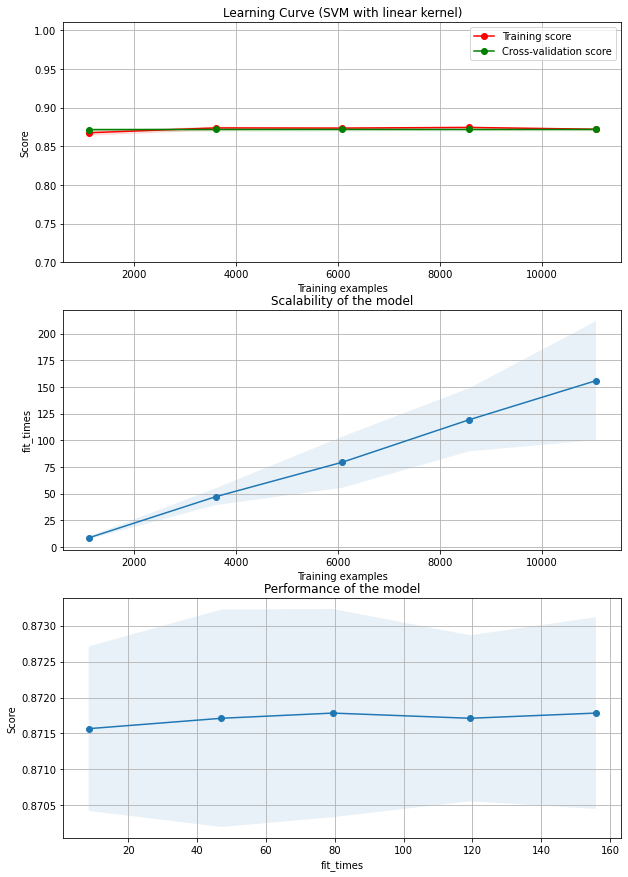

Accuracy for LinearSVM:0.8718198798527735,0.8701517706576728


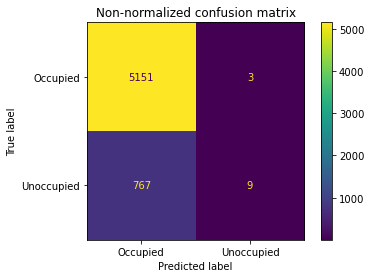

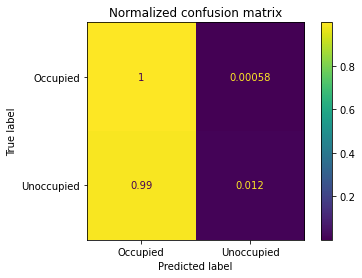

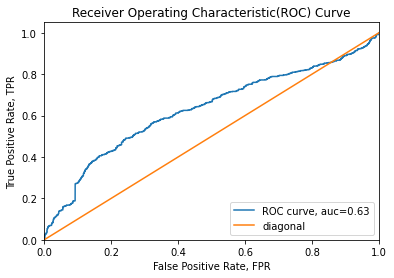

In [18]:
acc_train, clf = train_model(x_train, y_train, 'LinearSVM')
y_pred = clf.predict(x_test)
acc_test = accuracy_score(y_test, y_pred)

print('Accuracy for LinearSVM:{},{}'.format(acc_train, acc_test))

##### for ploting only #####
plot_binary_confusion_matrix(
    clf, x_test, y_test, ['Unoccupied', 'Occupied'])
plot_ROC(clf, x_test, y_test)

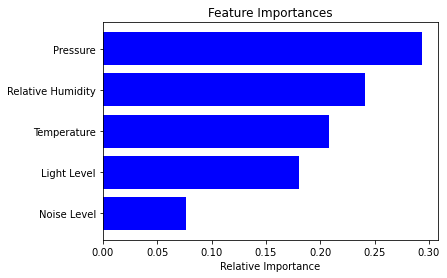

[learning_curve] Training set sizes: [ 1106  3597  6087  8577 11068]


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.


Fitting 5 folds for each of 110 candidates, totalling 550 fits
[CV 1/5; 1/110] START max_features=1, n_estimators=1............................
[CV 2/5; 1/110] START max_features=1, n_estimators=1............................[CV 3/5; 1/110] START max_features=1, n_estimators=1............................
[CV 4/5; 1/110] START max_features=1, n_estimators=1............................
[CV 5/5; 1/110] START max_features=1, n_estimators=1............................
[CV 1/5; 2/110] START max_features=1, n_estimators=11...........................

[CV 2/5; 2/110] START max_features=1, n_estimators=11...........................
[CV 3/5; 2/110] START max_features=1, n_estimators=11...........................
Fitting 5 folds for each of 110 candidates, totalling 550 fits
[CV 1/5; 1/110] START max_features=1, n_estimators=1............................[CV 2/5; 1/110] START max_features=1, n_estimators=1............................

[CV 3/5; 1/110] START max_features=1, n_estimators=1............

In [28]:
acc_train, clf = train_model(x_train, y_train, 'RandomForest')
y_pred = clf.predict(x_test)
acc = accuracy_score(y_test, y_pred)

print('Accuracy for RandomForest:{},{}'.format(acc_train, acc_test))

##### for ploting only #####
plot_binary_confusion_matrix(
    clf, x_test, y_test, ['Unoccupied', 'Occupied'])
plot_ROC(clf, x_test, y_test)